# Sociopathit Visuals - Comprehensive Test Suite

This notebook demonstrates and tests all visualization modules in the sociopathit package.

## 📚 Table of Contents

Click to jump to any section:

1. **[Setup & Initialization](#setup)** - Environment configuration
2. **[Basic Charts](#basic)** - Bar, histogram, pie, and scatter plots
3. **[Distribution Plots](#distribution)** - Density, KDE, ridgeline, ryder, raincloud, boxplot
4. **[Statistical Plots](#statistical)** - Coefficients, margins, odds ratios, residuals, ICE
5. **[Correlation & Relationships](#correlation)** - Heatmaps, pair plots, co-occurrence
6. **[Hierarchical & Clustering](#hierarchical)** - Dendrograms, treemaps, sunbursts
7. **[Temporal & Trends](#temporal)** - Trend lines, horizon charts
8. **[Geospatial](#geospatial)** - Maps, choropleths, hexbins
9. **[Network & Flow](#network)** - DAGs, Sankey, alluvial diagrams
10. **[Dimensional Analysis](#dimensional)** - Factor maps, PCA, MCA, scree plots
11. **[Text & Specialized](#specialized)** - Word clouds, feature importance, waterfalls

---

## 🚀 Quick Start

```python
# Example: Create a bar plot with Sociopathit styling
from sociopathit import visuals
import pandas as pd

df = pd.DataFrame({
    'category': ['A', 'B', 'C', 'D'],
    'value': [23, 45, 56, 78]
})

visuals.bar.bar(df, x='category', y='value', style_mode='viridis')
```

---

<a id='setup'></a>
# 1. Setup & Initialization

In [217]:
import os
import sys
import pandas as pd
import numpy as np
from pathlib import Path
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')

# Locate and add the package root
cwd = Path.cwd().resolve()
for parent in [cwd, *cwd.parents]:
    if (parent / "sociopathit").exists():
        ROOT = parent
        break
else:
    raise FileNotFoundError("Could not locate the sociopathit package root.")

# Add to sys.path for imports
if str(ROOT) not in sys.path:
    sys.path.insert(0, str(ROOT))

print(f"Added to sys.path: {ROOT}")

Added to sys.path: C:\Users\alecw\OneDrive - University of Toronto\Directives\GITTYSBURG\sociopathit


In [218]:
# Import all visualization modules
from sociopathit import visuals
import importlib

print("Sociopathit visuals module loaded successfully")
print(f"Available modules: {', '.join([m for m in dir(visuals) if not m.startswith('_')])}")

Sociopathit visuals module loaded successfully
Available modules: apc, bar, boxplot, cluster, coef, cooccur, dag, density, factormap, feature, flow, geographic, heatmap, hierarchical, hist, horizon, ice, margins, oddsratio, pair, pie, residuals, ryder, ryder_interactive, scatter, trend, waterfall, wordcloud


### Generate Sample Data for Testing

Create various datasets for testing different visualization types.

In [219]:
# Set random seed for reproducibility
np.random.seed(42)

# 1. Simple categorical data
df_categories = pd.DataFrame({
    'category': ['Category A', 'Category B', 'Category C', 'Category D', 'Category E'],
    'value': [23, 45, 56, 78, 34],
    'count': [120, 89, 156, 203, 91]
})

# 2. Continuous distribution data
n_samples = 500
df_continuous = pd.DataFrame({
    'value': np.concatenate([
        np.random.normal(50, 10, n_samples//2),
        np.random.normal(70, 15, n_samples//2)
    ]),
    'group': ['Group 1'] * (n_samples//2) + ['Group 2'] * (n_samples//2),
    'satisfaction': np.random.randint(1, 8, n_samples),
    'income': np.random.gamma(2, 20000, n_samples),
    'age': np.random.randint(18, 75, n_samples)
})

# 3. Longitudinal/time series data
dates = pd.date_range('2020-01-01', periods=36, freq='M')
df_temporal = pd.DataFrame({
    'date': dates,
    'value': 100 + np.cumsum(np.random.randn(36) * 5),
    'category': np.random.choice(['Product A', 'Product B', 'Product C'], 36)
})

# 4. Correlation matrix data
n_vars = 6
correlation_matrix = np.random.rand(n_vars, n_vars)
correlation_matrix = (correlation_matrix + correlation_matrix.T) / 2
np.fill_diagonal(correlation_matrix, 1.0)
df_corr = pd.DataFrame(
    correlation_matrix,
    columns=[f'Var{i+1}' for i in range(n_vars)],
    index=[f'Var{i+1}' for i in range(n_vars)]
)

# 5. Regression coefficients data
df_coefs = pd.DataFrame({
    'variable': ['Age', 'Education', 'Income', 'Experience', 'Urban'],
    'coef': [0.15, 0.42, 0.23, 0.31, -0.18],
    'se': [0.05, 0.08, 0.06, 0.07, 0.09],
})
df_coefs['lower'] = df_coefs['coef'] - 1.96 * df_coefs['se']
df_coefs['upper'] = df_coefs['coef'] + 1.96 * df_coefs['se']

# 6. Geographic data
df_geo = pd.DataFrame({
    'city': ['Toronto', 'Vancouver', 'Montreal', 'Calgary', 'Ottawa'],
    'lat': [43.65, 49.28, 45.50, 51.05, 45.42],
    'lon': [-79.38, -123.12, -73.57, -114.07, -75.70],
    'value': [2930000, 675218, 1704694, 1239220, 934243]
})

# 7. Multi-group ridgeline data
df_ridgeline = pd.DataFrame({
    'value': np.concatenate([
        np.random.normal(50, 10, 200),
        np.random.normal(60, 12, 200),
        np.random.normal(55, 8, 200),
        np.random.normal(70, 15, 200),
        np.random.normal(45, 9, 200)
    ]),
    'cohort': (['2018'] * 200 + ['2019'] * 200 + ['2020'] * 200 + 
              ['2021'] * 200 + ['2022'] * 200)
})

print("Sample datasets created successfully")
print(f"  - df_categories: {df_categories.shape}")
print(f"  - df_continuous: {df_continuous.shape}")
print(f"  - df_temporal: {df_temporal.shape}")
print(f"  - df_corr: {df_corr.shape}")
print(f"  - df_coefs: {df_coefs.shape}")
print(f"  - df_geo: {df_geo.shape}")
print(f"  - df_ridgeline: {df_ridgeline.shape}")

Sample datasets created successfully
  - df_categories: (5, 3)
  - df_continuous: (500, 5)
  - df_temporal: (36, 3)
  - df_corr: (6, 6)
  - df_coefs: (5, 5)
  - df_geo: (5, 4)
  - df_ridgeline: (1000, 2)


<a id='basic'></a>
# 2. Basic Charts

Test fundamental chart types: bar charts, histograms, pie charts, and scatter plots.

## 2.1 Bar Charts

TEST 1: Basic Vertical Bar Chart


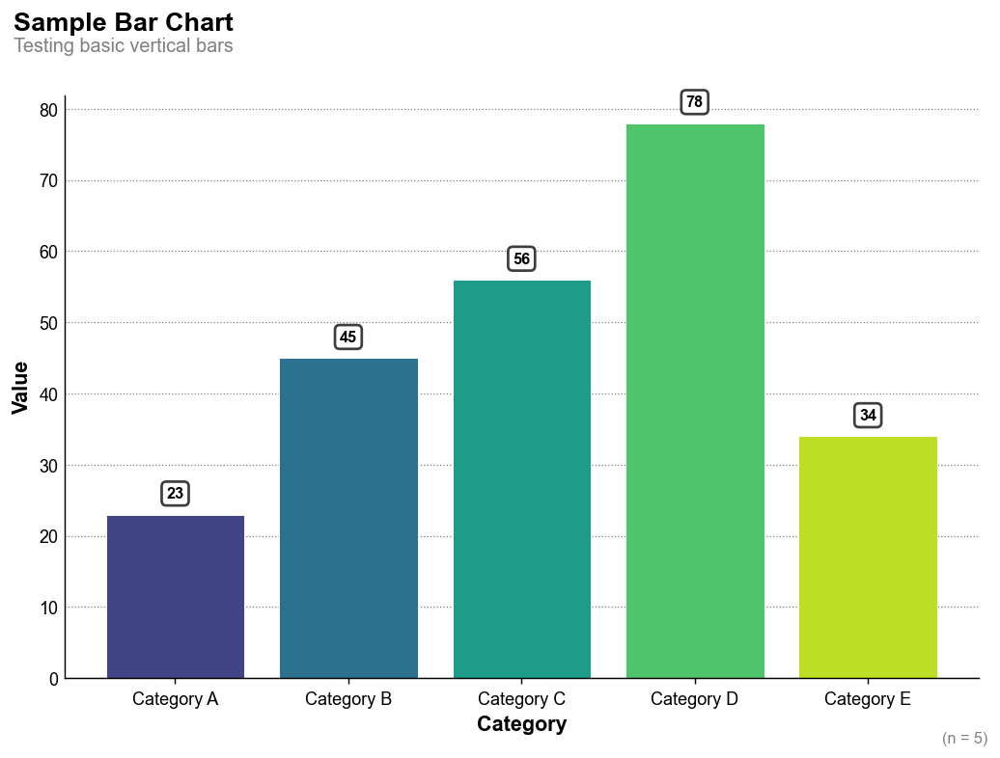

In [220]:
# Reload module
from sociopathit.visuals import bar as bar_module
importlib.reload(bar_module)
from sociopathit.visuals.bar import bar, bar_subplots, bar_interactive

print("=" * 60)
print("TEST 1: Basic Vertical Bar Chart")
print("=" * 60)

fig, ax = bar(
    df_categories,
    x='category',
    y='value',
    title='Sample Bar Chart',
    subtitle='Testing basic vertical bars',
    style_mode='viridis',
    n=len(df_categories)
)

plt.close()

TEST 2: Horizontal Bar Chart with Highlight


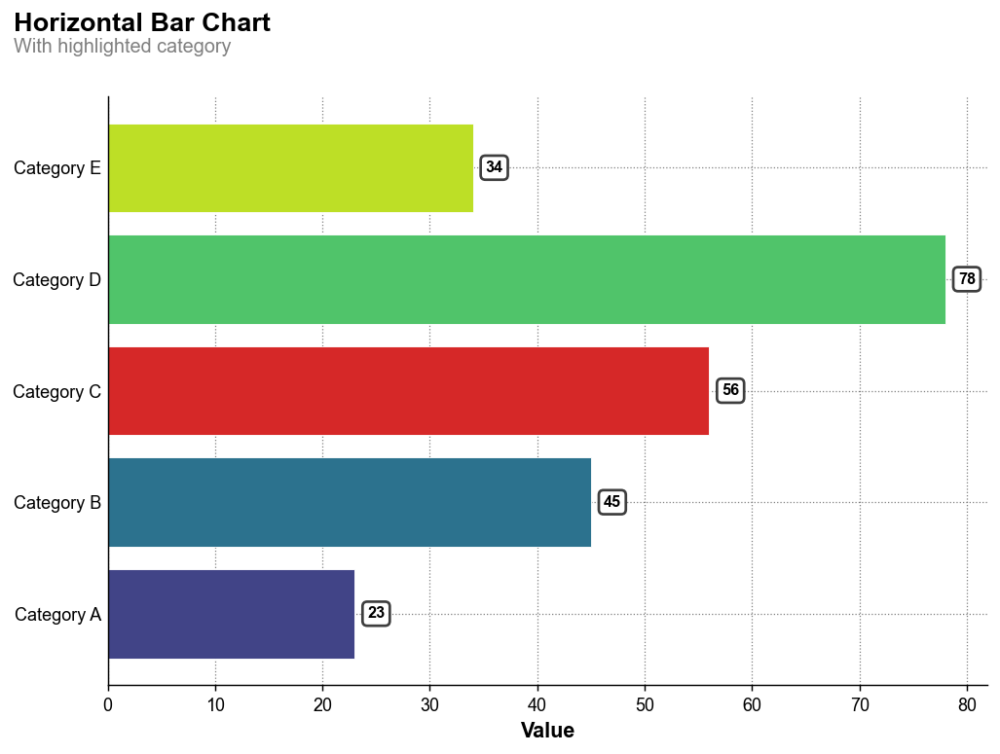

In [221]:
print("=" * 60)
print("TEST 2: Horizontal Bar Chart with Highlight")
print("=" * 60)

fig, ax = bar(
    df_categories,
    x='category',
    y='value',
    title='Horizontal Bar Chart',
    subtitle='With highlighted category',
    orientation='horizontal',
    highlight='Category C',
    highlight_color='#D62828',
    style_mode='viridis'
)

plt.close()

In [222]:
print("=" * 60)
print("TEST 3: Interactive Bar Chart")
print("=" * 60)

fig = bar_interactive(
    df_categories,
    x='category',
    y='value',
    title='Interactive Bar Chart',
    subtitle='Hover to see values',
    style_mode='viridis'
)

fig.show()

TEST 3: Interactive Bar Chart


## 2.2 Histograms

TEST 4: Basic Histogram


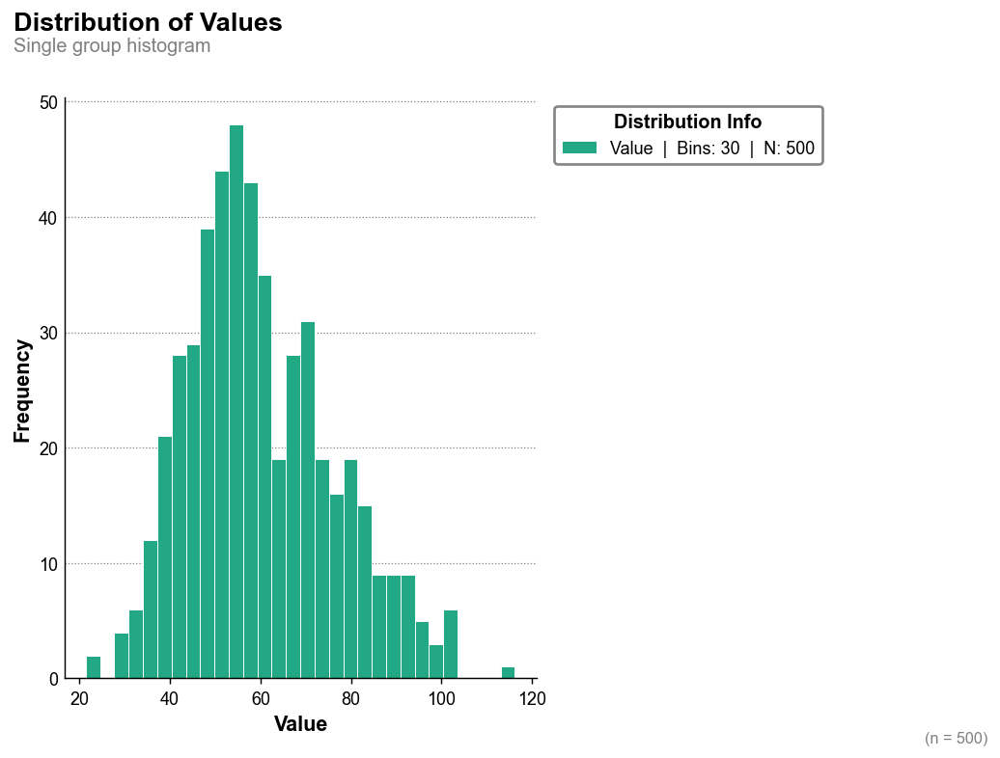

In [223]:
from sociopathit.visuals import hist as hist_module
importlib.reload(hist_module)
from sociopathit.visuals.hist import histogram, histogram_interactive

print("=" * 60)
print("TEST 4: Basic Histogram")
print("=" * 60)

fig, ax = histogram(
    df_continuous,
    x='value',
    title='Distribution of Values',
    subtitle='Single group histogram',
    bins=30,
    style_mode='viridis'
)

plt.close()

## 2.3 Pie Charts

TEST 7: Basic Pie Chart


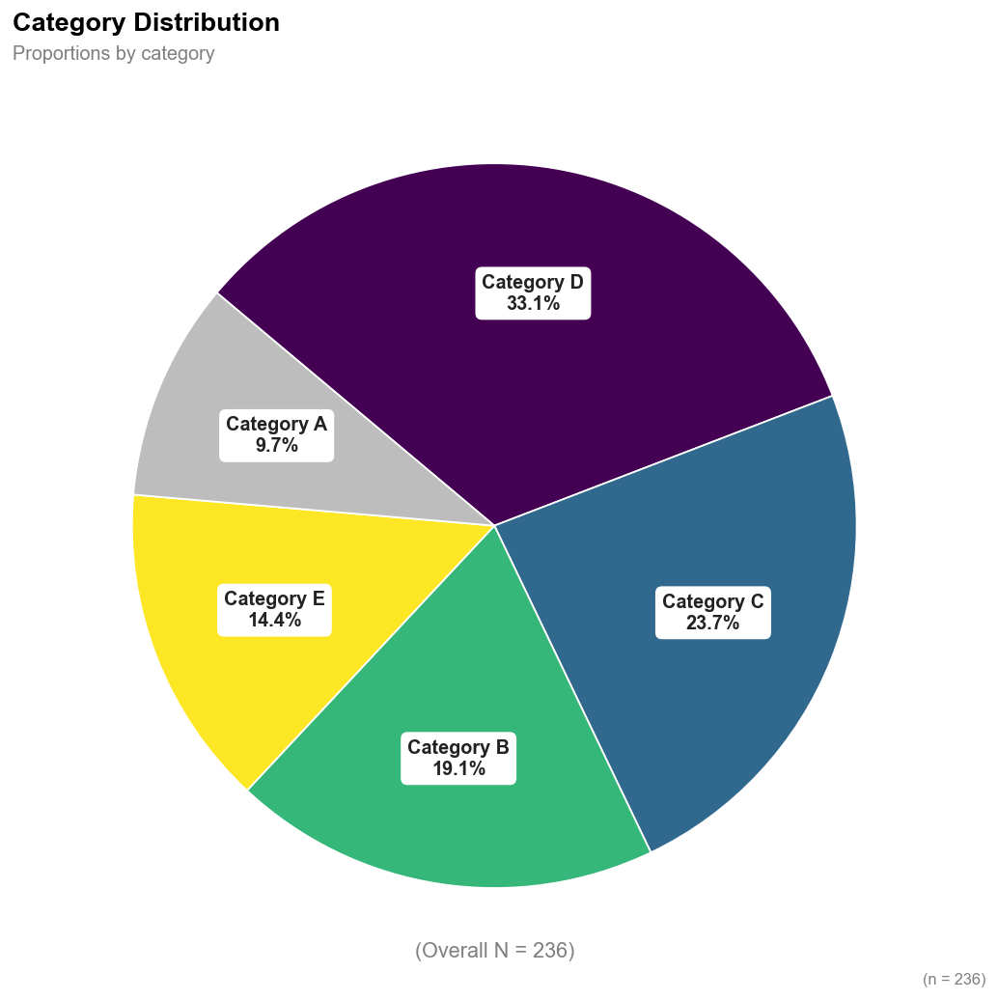

In [224]:
from sociopathit.visuals import pie
from sociopathit.visuals.pie import pie, pie_interactive
print("=" * 60)
print("TEST 7: Basic Pie Chart")
print("=" * 60)
fig, ax = pie(
    df_categories,    category_col='category',    value_col='value',    title='Category Distribution',    subtitle='Proportions by category',    style_mode='viridis')
plt.close()

In [225]:
print("=" * 60)
print("TEST 8: Interactive Pie Chart")
print("=" * 60)
fig = pie_interactive(
    df_categories,    category_col='category',    value_col='value',    title='Interactive Pie Chart',    style_mode='plainjane')
fig.show()

TEST 8: Interactive Pie Chart


## 2.4 Scatter Plots

TEST 9: Basic Scatter Plot


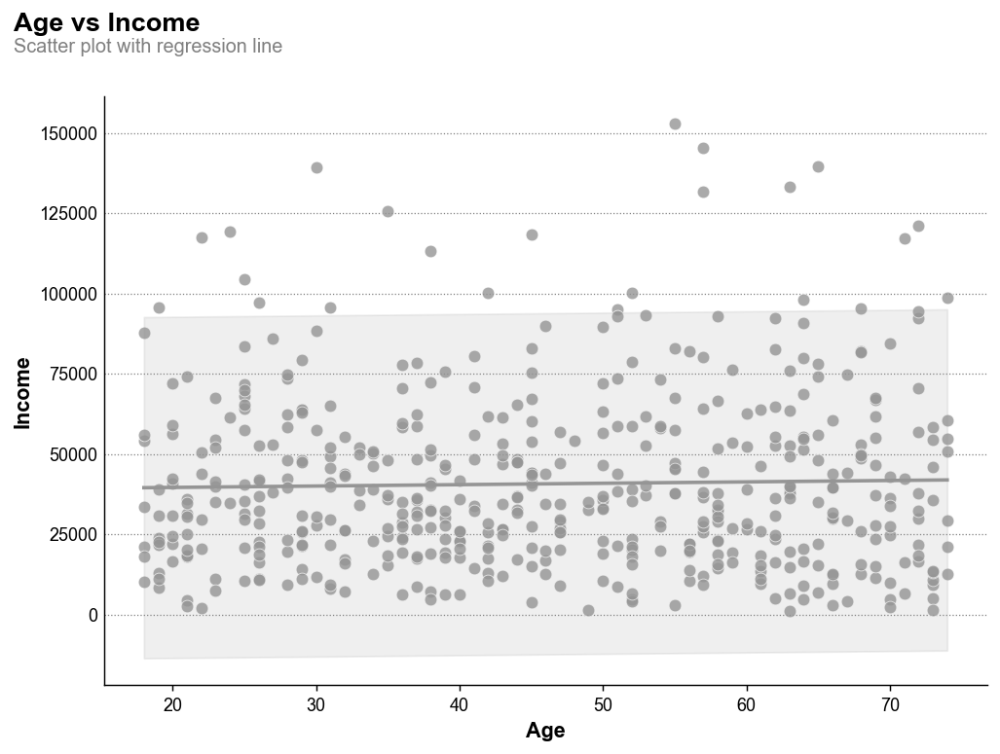

In [226]:
from sociopathit.visuals import scatter
from sociopathit.visuals.scatter import scatterplot, scatterplot_interactive

print("=" * 60)
print("TEST 9: Basic Scatter Plot")
print("=" * 60)
fig, ax = scatterplot(
    df_continuous,    x='age',    y='income',    title='Age vs Income',    subtitle='Scatter plot with regression line',    style_mode='reviewer3',    line=True)
plt.close()

TEST 10: Grouped Scatter Plot


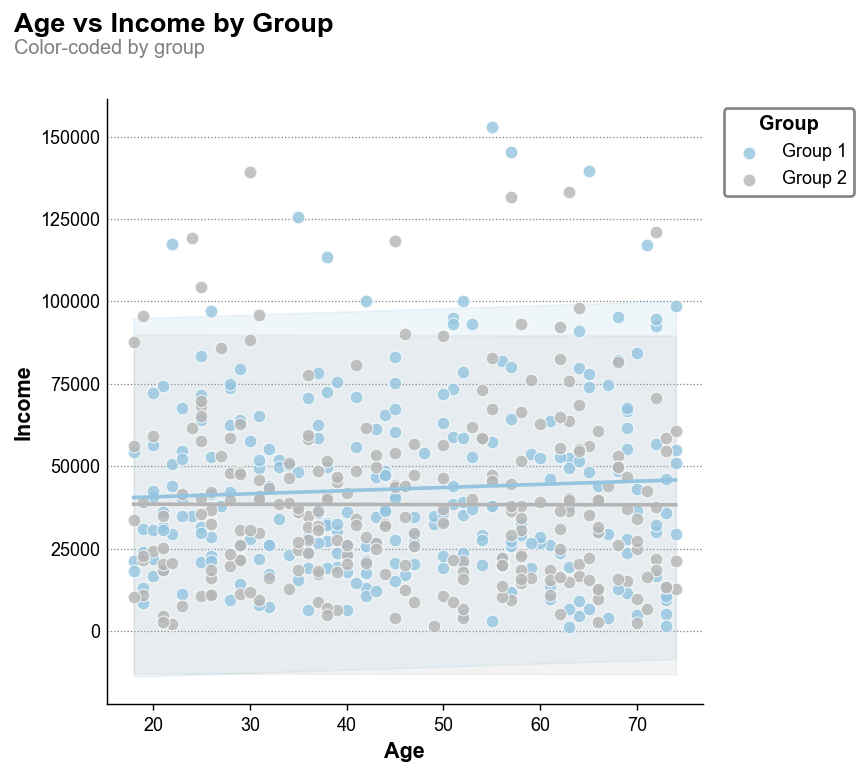

In [227]:
print("=" * 60)
print("TEST 10: Grouped Scatter Plot")
print("=" * 60)

fig, ax = scatterplot(
    df_continuous,
    x='age',
    y='income',
    group='group',
    title='Age vs Income by Group',
    subtitle='Color-coded by group',
    style_mode='plainjane'
)

plt.close()

In [228]:
print("=" * 60)
print("TEST 11: Interactive Scatter Plot")
print("=" * 60)

fig = scatterplot_interactive(
    df_continuous,
    x='age',
    y='income',
    group='group',
    title='Interactive Scatter Plot',
    style_mode='sentiment'
)

fig.show()

TEST 11: Interactive Scatter Plot


<a id='distribution'></a>
# 3. Distribution Plots

Test density estimation, ridgeline plots, ryder plots, raincloud plots, and box plots.

## 3.1 Kernel Density Estimation (KDE)

TEST 12: Single KDE Plot


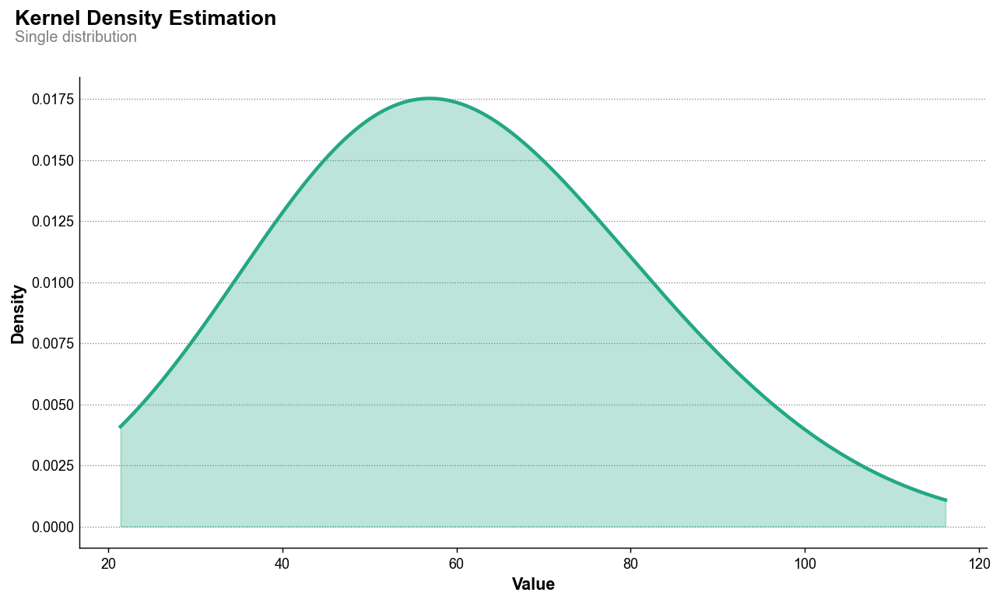

In [229]:
from sociopathit.visuals import density as density_module
importlib.reload(density_module)
from sociopathit.visuals.density import kde, kde_interactive

print("=" * 60)
print("TEST 12: Single KDE Plot")
print("=" * 60)

fig, ax = kde(
    df_continuous,
    x='value',
    title='Kernel Density Estimation',
    subtitle='Single distribution',
    style_mode='viridis',
    fill=True
)

plt.close()

TEST 13: Grouped KDE Plot


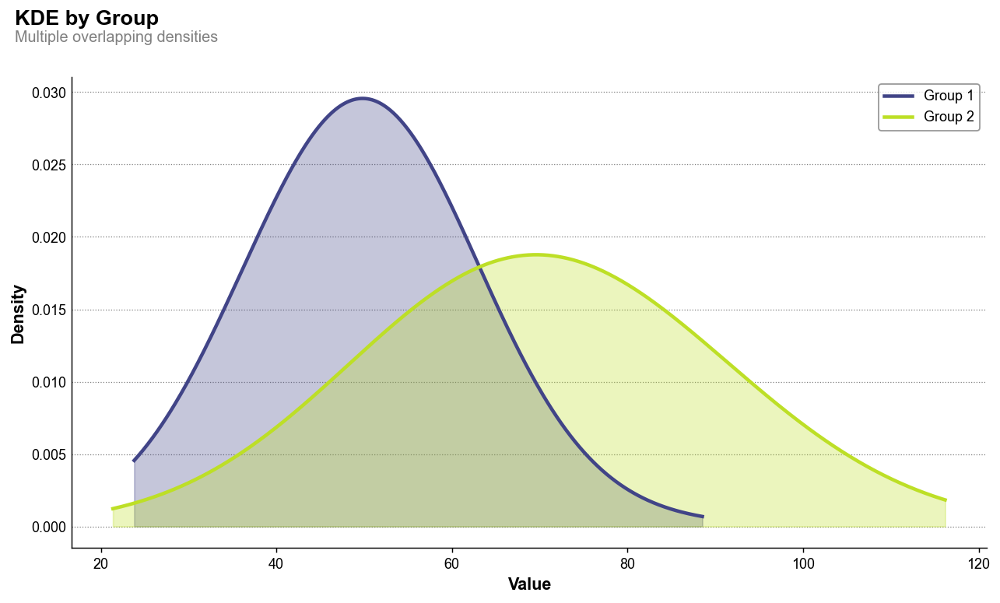

In [230]:
print("=" * 60)
print("TEST 13: Grouped KDE Plot")
print("=" * 60)

fig, ax = kde(
    df_continuous,
    x='value',
    group='group',
    title='KDE by Group',
    subtitle='Multiple overlapping densities',
    style_mode='viridis',
    fill=True
)

plt.close()

In [231]:
print("=" * 60)
print("TEST 14: Interactive KDE")
print("=" * 60)

fig = kde_interactive(
    df_continuous,
    x='value',
    group='group',
    title='Interactive KDE',
    style_mode='viridis'
)

fig.show()

TEST 14: Interactive KDE


## 3.2 Ridgeline Plots

TEST 15: Ridgeline Plot


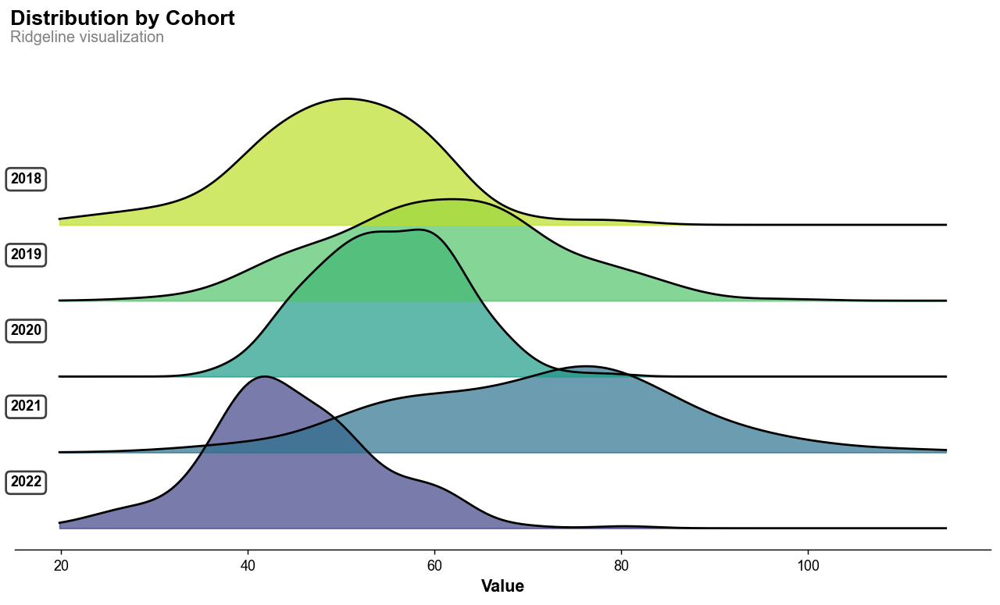

In [232]:
from sociopathit.visuals.density import ridgeline

print("=" * 60)
print("TEST 15: Ridgeline Plot")
print("=" * 60)

fig, ax = ridgeline(
    df_ridgeline,
    x='value',
    group='cohort',
    title='Distribution by Cohort',
    subtitle='Ridgeline visualization',
    style_mode='viridis',
    overlap=0.5
)

plt.close()

## 3.3 Ryder Plots (Ryderplots)

TEST 16: Ryder Plot (Static)


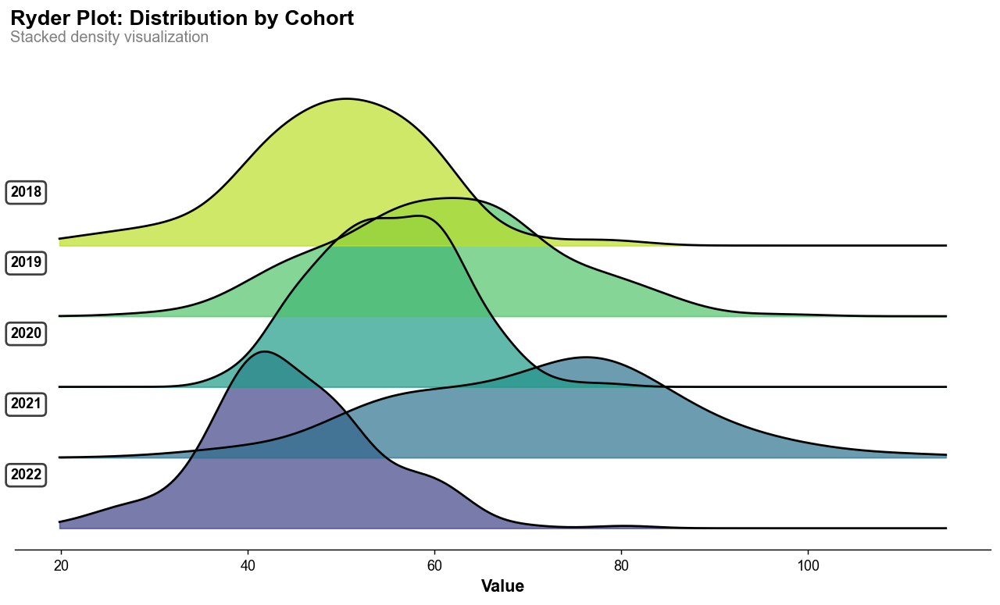

In [233]:
from sociopathit.visuals import ryder, ryder_interactive

print("=" * 60)
print("TEST 16: Ryder Plot (Static)")
print("=" * 60)

fig, ax = ryder(
    df_ridgeline,
    x='value',
    group='cohort',
    title='Ryder Plot: Distribution by Cohort',
    subtitle='Stacked density visualization',
    style_mode='viridis',
    overlap=0.6
)

plt.close()

In [234]:
print("=" * 60)
print("TEST 17: Ryder Plot (Interactive)")
print("=" * 60)

fig = ryder_interactive(
    df_ridgeline,
    x='value',
    group='cohort',
    title='Interactive Ryder Plot',
    subtitle='Hover to explore distributions',
    style_mode='viridis',
    overlap=0.5
)

fig.show()

TEST 17: Ryder Plot (Interactive)


## 3.4 Raincloud Plots

TEST 18: Raincloud Plot


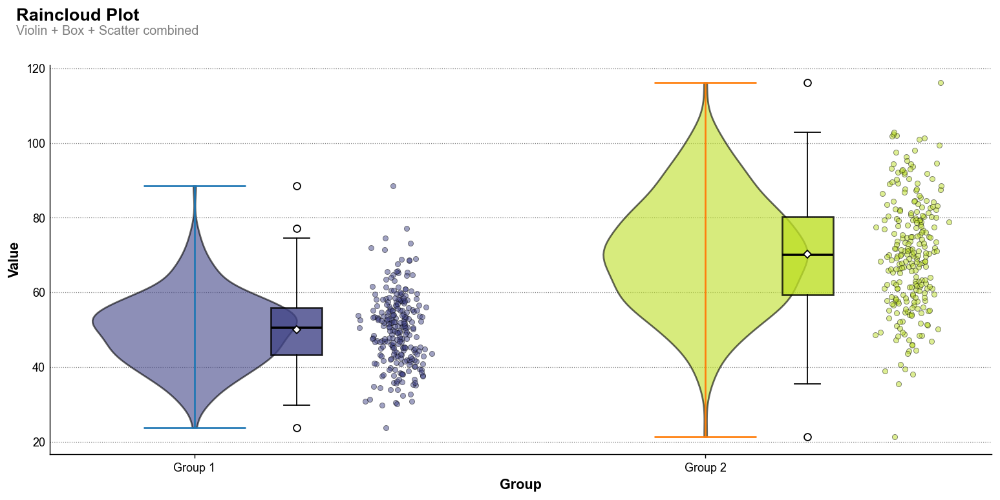

In [235]:
from sociopathit.visuals.density import raincloud

print("=" * 60)
print("TEST 18: Raincloud Plot")
print("=" * 60)

fig, ax = raincloud(
    df_continuous,
    x='group',
    y='value',
    title='Raincloud Plot',
    subtitle='Violin + Box + Scatter combined',
    style_mode='viridis'
)

plt.close()

## 3.5 Box and Violin Plots

TEST 19: Box Plot


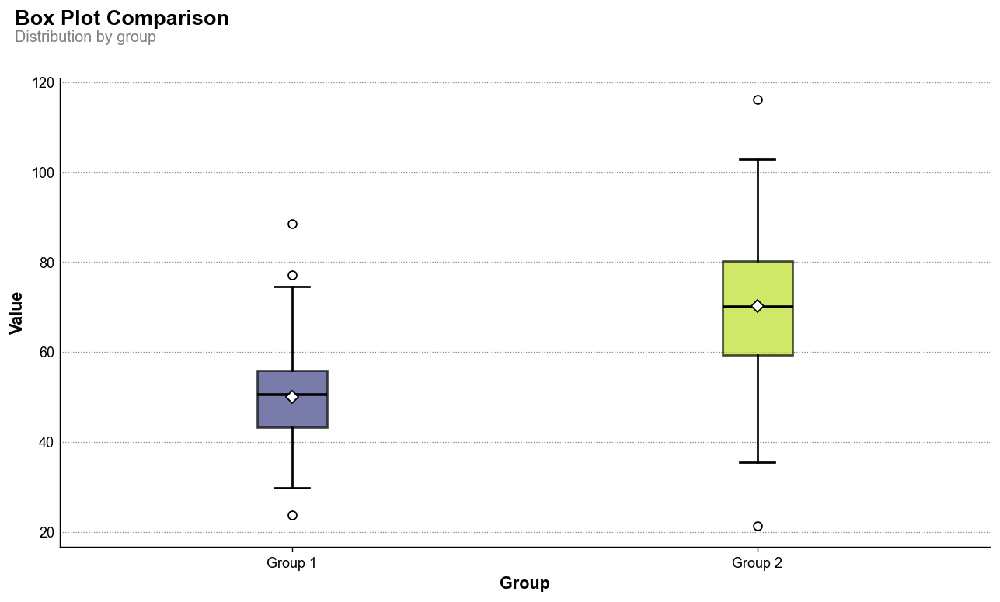

In [236]:
from sociopathit.visuals import boxplot
from sociopathit.visuals.boxplot import boxplot, boxplot_interactive
print("=" * 60)
print("TEST 19: Box Plot")
print("=" * 60)
fig, ax = boxplot(
    df_continuous,    x='group',    y='value',    title='Box Plot Comparison',    subtitle='Distribution by group',    style_mode='viridis',    violin=False)
plt.close()

TEST 20: Violin Plot


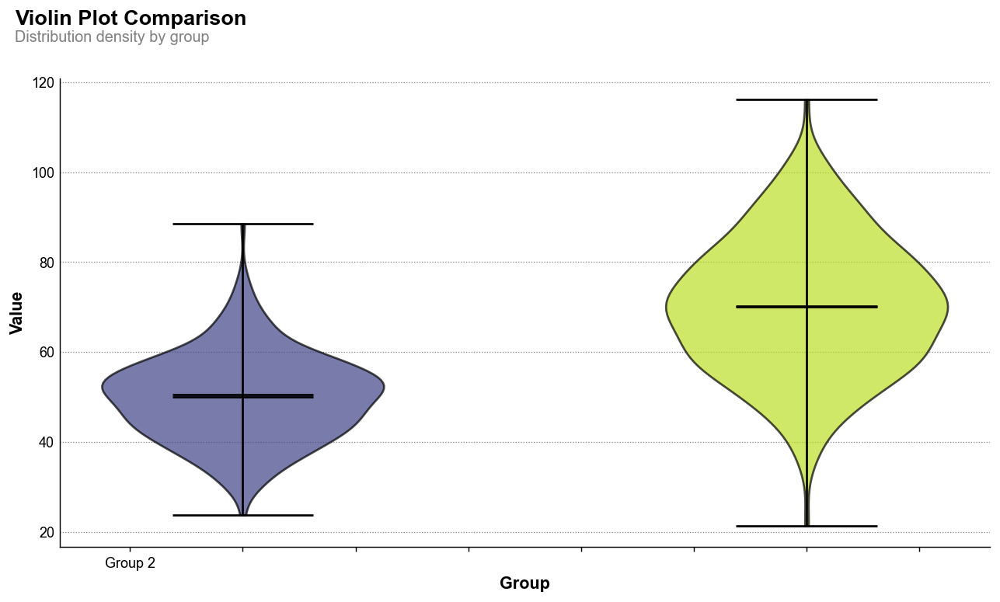

In [237]:
print("=" * 60)
print("TEST 20: Violin Plot")
print("=" * 60)

fig, ax = boxplot(
    df_continuous,
    x='group',
    y='value',
    title='Violin Plot Comparison',
    subtitle='Distribution density by group',
    style_mode='viridis',
    violin=True
)

plt.close()

In [238]:
print("=" * 60)
print("TEST 21: Interactive Box Plot")
print("=" * 60)

fig = boxplot_interactive(
    df_continuous,
    x='group',
    y='value',
    title='Interactive Box Plot',
    style_mode='viridis'
)

fig.show()

TEST 21: Interactive Box Plot


<a id='statistical'></a>
# 4. Statistical Plots

Test coefficient plots, marginal effects, odds ratios, residual diagnostics, and ICE plots.

## 4.1 Coefficient Plots

TEST 22: Coefficient Plot


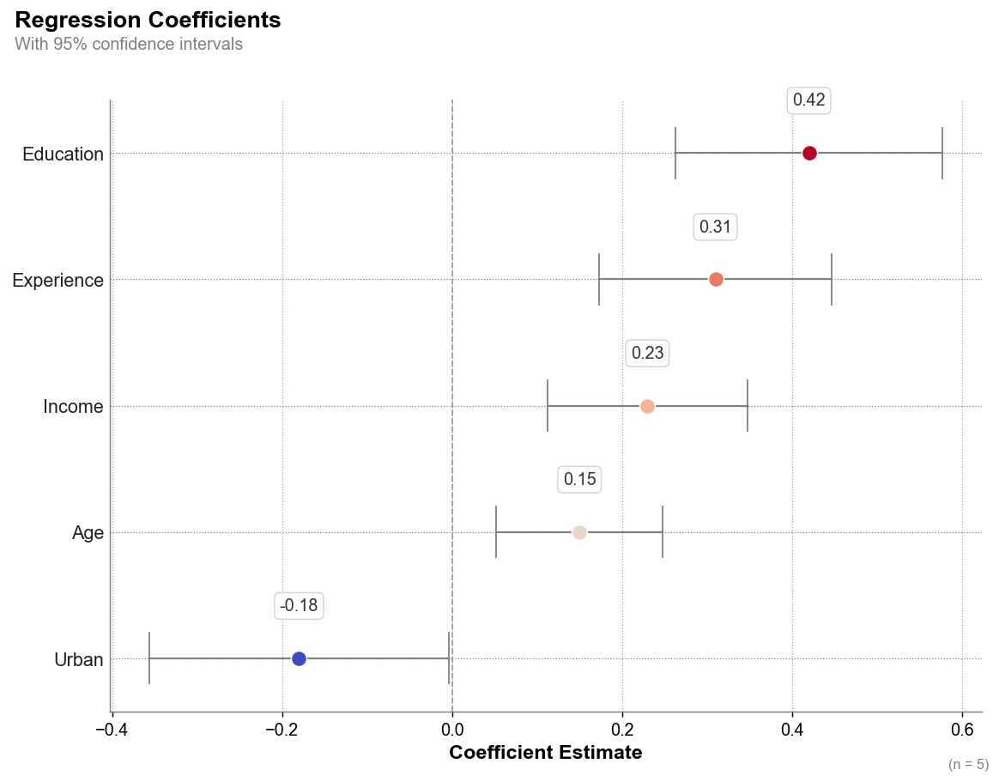

In [239]:
from sociopathit.visuals import coef
from sociopathit.visuals.coef import coef, coef_interactive
print("=" * 60)
print("TEST 22: Coefficient Plot")
print("=" * 60)
fig, ax = coef(
    df_coefs,
    term_col='variable',
    estimate_col='coef',
    lower_col='lower',
    upper_col='upper',
    title='Regression Coefficients',
    subtitle='With 95% confidence intervals',
    style_mode='viridis')
plt.close()

In [240]:
print("=" * 60)
print("TEST 23: Interactive Coefficient Plot")
print("=" * 60)
fig = coef_interactive(
    df_coefs,
    term_col='variable',
    estimate_col='coef',
    lower_col='lower',
    upper_col='upper',
    title='Interactive Coefficients',
    style_mode='viridis')
fig.show()

TEST 23: Interactive Coefficient Plot


## 4.2 Odds Ratio Plots

In [241]:
from sociopathit.visuals import oddsratio as or_module
importlib.reload(or_module)
from sociopathit.visuals.oddsratio import oddsratio, oddsratio_interactive

# Create odds ratio data in the expected format
# The oddsratio function expects 'term', 'estimate', 'conf.low', 'conf.high'
# where estimates are log odds (will be exponentiated internally)
df_or_input = pd.DataFrame({
    'term': ['Age', 'Education', 'Income', 'Experience', 'Urban'],
    'estimate': [0.15, 0.42, 0.23, 0.31, -0.18],  # log odds
    'conf.low': [0.15 - 1.96 * 0.05, 0.42 - 1.96 * 0.08, 0.23 - 1.96 * 0.06, 0.31 - 1.96 * 0.07, -0.18 - 1.96 * 0.09],
    'conf.high': [0.15 + 1.96 * 0.05, 0.42 + 1.96 * 0.08, 0.23 + 1.96 * 0.06, 0.31 + 1.96 * 0.07, -0.18 + 1.96 * 0.09]
})

print("=" * 60)
print("TEST 24: Odds Ratio Forest Plot")
print("=" * 60)

fig = oddsratio(
    coef_df=df_or_input,
    exclude_intercept=False,  # No intercept in our data
    title='Odds Ratios',
    subtitle='Forest plot with confidence intervals',
    style_mode='viridis'
)

plt.close()

TEST 24: Odds Ratio Forest Plot


In [242]:
print("=" * 60)
print("TEST 25: Interactive Odds Ratio Plot")
print("=" * 60)

fig = oddsratio_interactive(
    coef_df=df_or_input,
    exclude_intercept=False,
    title='Interactive Odds Ratios',
    style_mode='viridis'
)

fig.show()

TEST 25: Interactive Odds Ratio Plot


## 4.3 Residual Diagnostic Plots

REGRESSION MODEL SUMMARY
R-squared: 0.0052
Formula: income ~ age + satisfaction + value
TEST 26: Residuals Diagnostic Panel


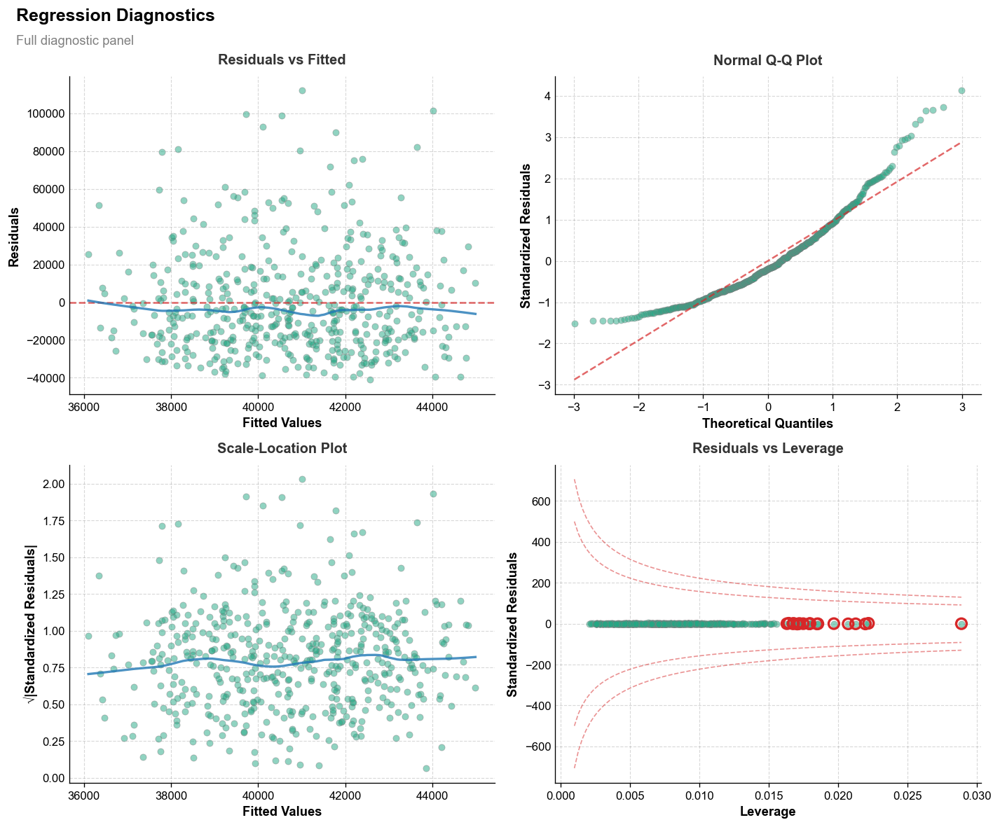

✓ All diagnostics panel created successfully

TEST 27: Individual Diagnostic Plots


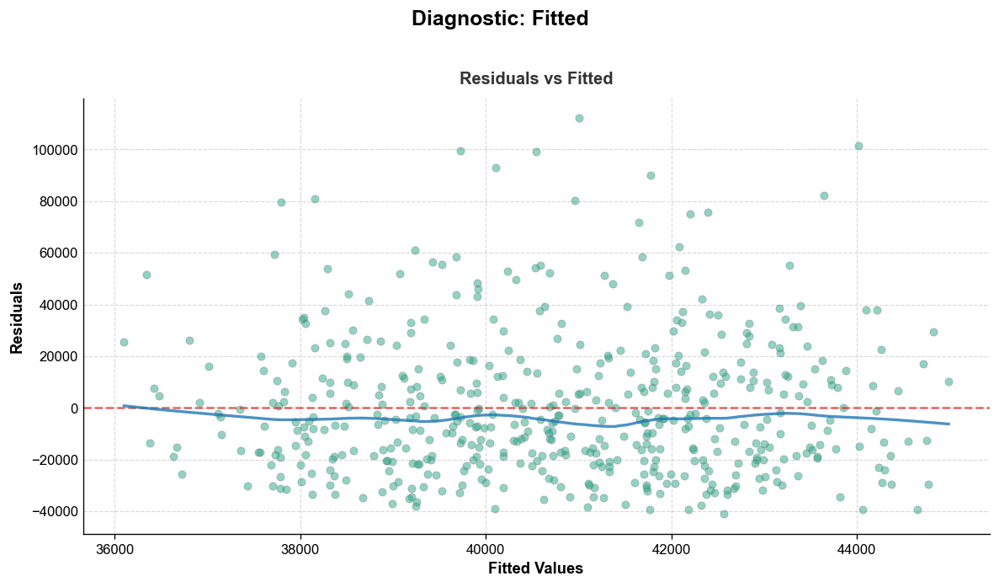

✓ Fitted plot created successfully


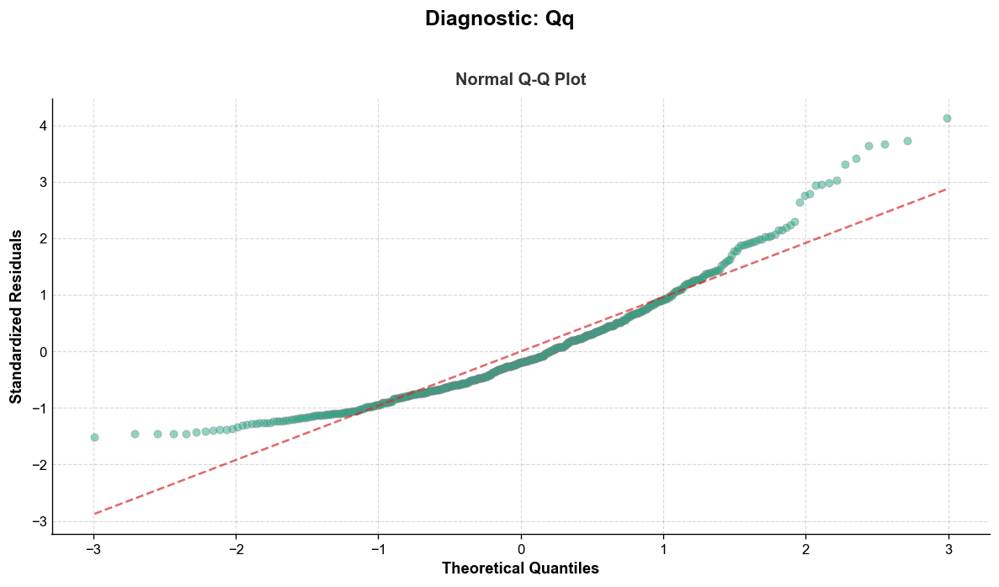

✓ Qq plot created successfully


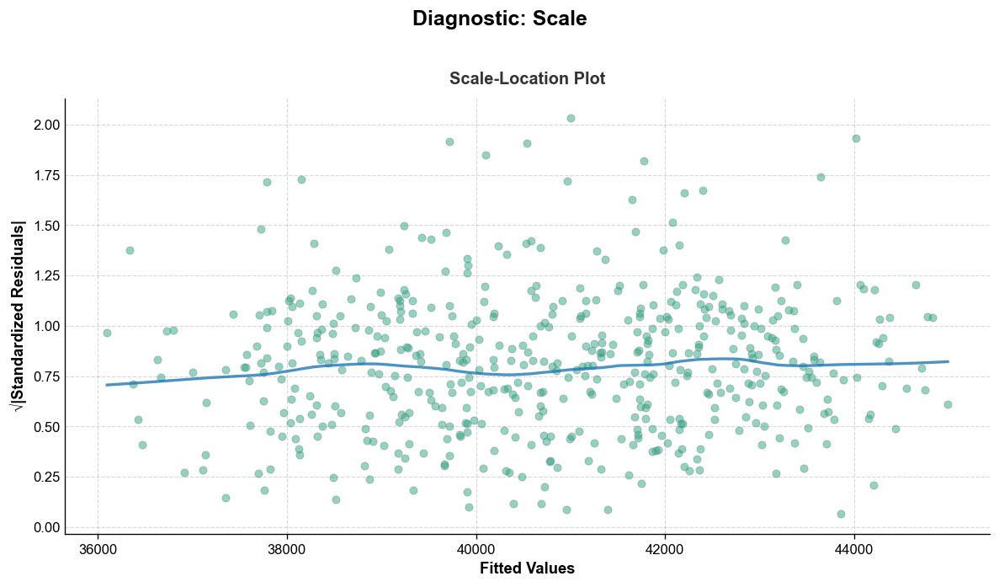

✓ Scale plot created successfully


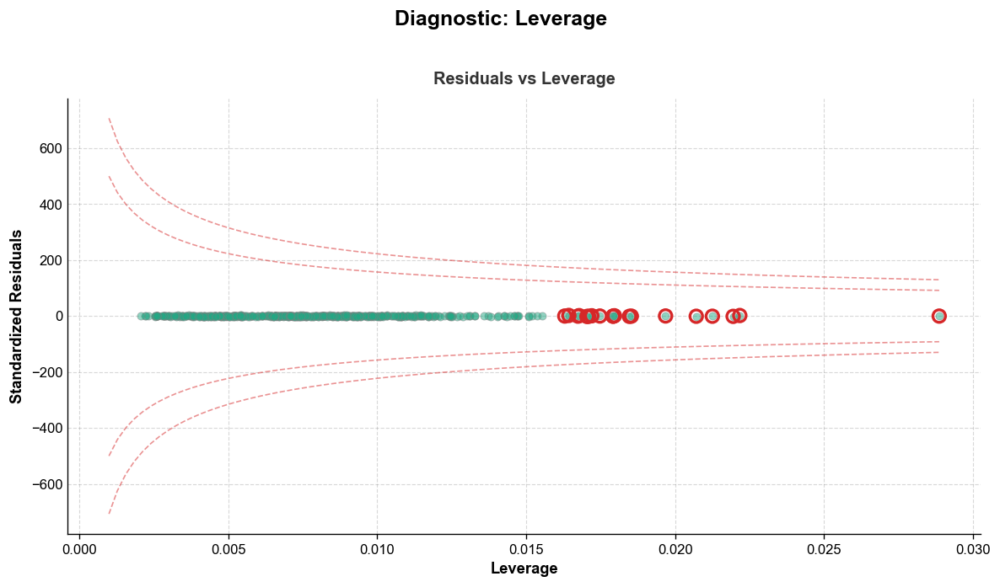

✓ Leverage plot created successfully

TEST 28: Residuals Histogram


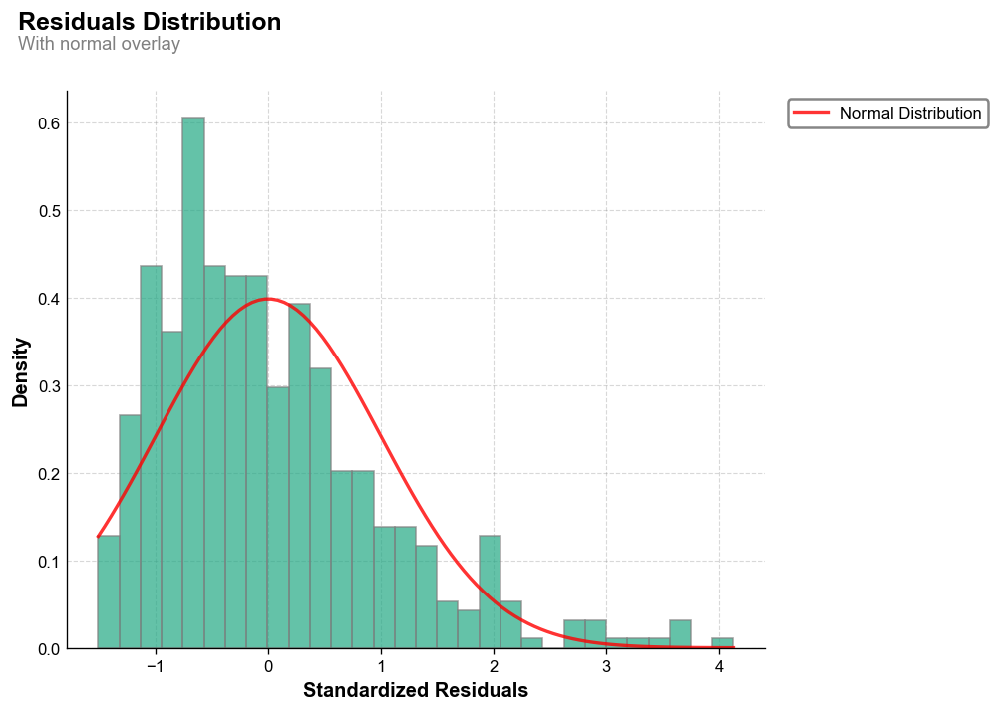

✓ Residuals histogram created successfully

TEST 29: Interactive Residuals Plots


✓ Interactive fitted plot created successfully


✓ Interactive qq plot created successfully

ALL RESIDUALS TESTS COMPLETED


In [243]:
# First, fit a regression model for residual and margin tests
import statsmodels.formula.api as smf
import matplotlib.pyplot as plt
import importlib

# Create a regression model using the continuous data
# Fit OLS regression: income ~ age + satisfaction + value
formula = 'income ~ age + satisfaction + value'
model_ols = smf.ols(formula, data=df_continuous).fit()

print("=" * 60)
print("REGRESSION MODEL SUMMARY")
print("=" * 60)
print(f"R-squared: {model_ols.rsquared:.4f}")
print(f"Formula: {formula}")
print("=" * 60)

# Now test residuals function
from sociopathit.visuals import residuals as residuals_module
importlib.reload(residuals_module)
from sociopathit.visuals.residuals import residuals, residuals_interactive

print("=" * 60)
print("TEST 26: Residuals Diagnostic Panel")
print("=" * 60)

# Create a model wrapper that has the expected interface
class ModelWrapper:
    def __init__(self, results):
        self.results = results
        # Handle dataframe access - try different attributes
        if hasattr(results, 'model') and hasattr(results.model, 'data'):
            if hasattr(results.model.data, 'frame'):
                self.df = results.model.data.frame
            elif hasattr(results.model.data, 'orig_endog'):
                # Reconstruct dataframe if frame is not available
                self.df = df_continuous
        else:
            self.df = df_continuous

# Create wrapper with the fitted model
wrapper = ModelWrapper(model_ols)

# Test all diagnostic plots
try:
    fig = residuals(
        wrapper,
        plot_type='all',
        title='Regression Diagnostics',
        subtitle='Full diagnostic panel',
        style_mode='viridis'
    )
    plt.show()
    print("✓ All diagnostics panel created successfully")
except Exception as e:
    print(f"✗ Error creating all diagnostics: {e}")
    import traceback
    traceback.print_exc()
finally:
    plt.close('all')

print()

# Test individual plot types
print("=" * 60)
print("TEST 27: Individual Diagnostic Plots")
print("=" * 60)

plot_types = ['fitted', 'qq', 'scale', 'leverage']

for plot_type in plot_types:
    try:
        fig = residuals(
            wrapper,
            plot_type=plot_type,
            title=f'Diagnostic: {plot_type.capitalize()}',
            style_mode='viridis'
        )
        plt.show()
        print(f"✓ {plot_type.capitalize()} plot created successfully")
    except Exception as e:
        print(f"✗ Error creating {plot_type} plot: {e}")
    finally:
        plt.close('all')

print()

# Test residuals histogram
print("=" * 60)
print("TEST 28: Residuals Histogram")
print("=" * 60)

try:
    from sociopathit.visuals.residuals import residuals_histogram

    fig = residuals_histogram(
        wrapper,
        bins=30,
        title='Residuals Distribution',
        subtitle='With normal overlay',
        style_mode='viridis'
    )
    plt.show()
    print("✓ Residuals histogram created successfully")
except Exception as e:
    print(f"✗ Error creating histogram: {e}")
    import traceback
    traceback.print_exc()
finally:
    plt.close('all')

print()

# Test interactive plots
print("=" * 60)
print("TEST 29: Interactive Residuals Plots")
print("=" * 60)

interactive_types = ['fitted', 'qq']

for plot_type in interactive_types:
    try:
        fig = residuals_interactive(
            wrapper,
            plot_type=plot_type,
            title=f'Interactive {plot_type.capitalize()}',
            style_mode='viridis'
        )
        fig.show()
        print(f"✓ Interactive {plot_type} plot created successfully")
    except Exception as e:
        print(f"✗ Error creating interactive {plot_type} plot: {e}")

print()
print("=" * 60)
print("ALL RESIDUALS TESTS COMPLETED")
print("=" * 60)

## 4.4 Marginal Effects Plots

TESTS 28-29: Marginal Effects Tests


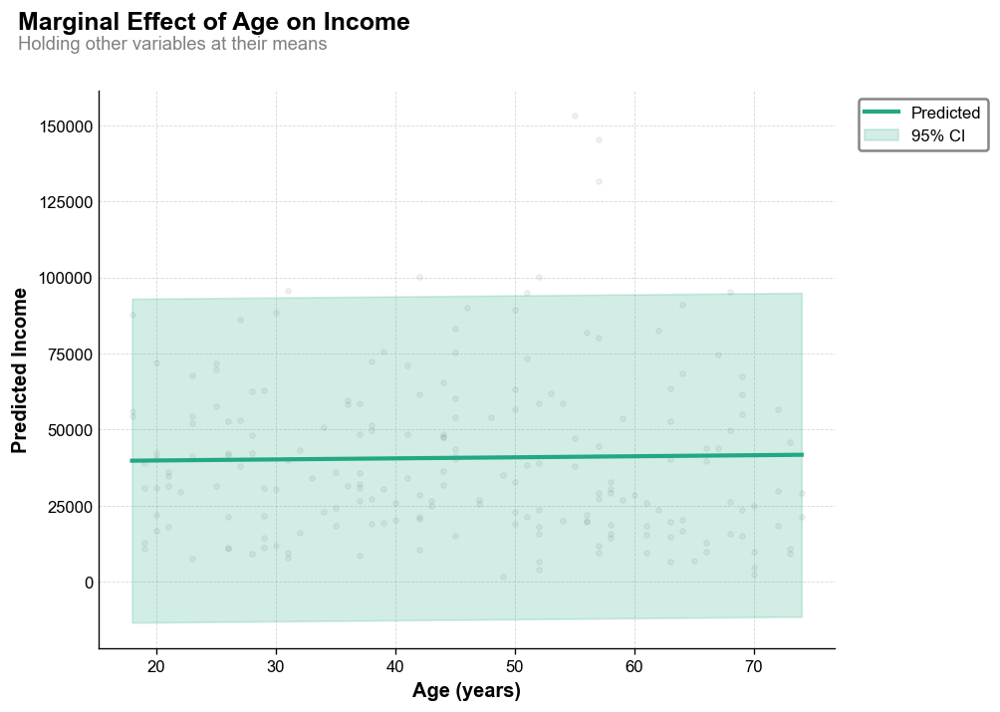

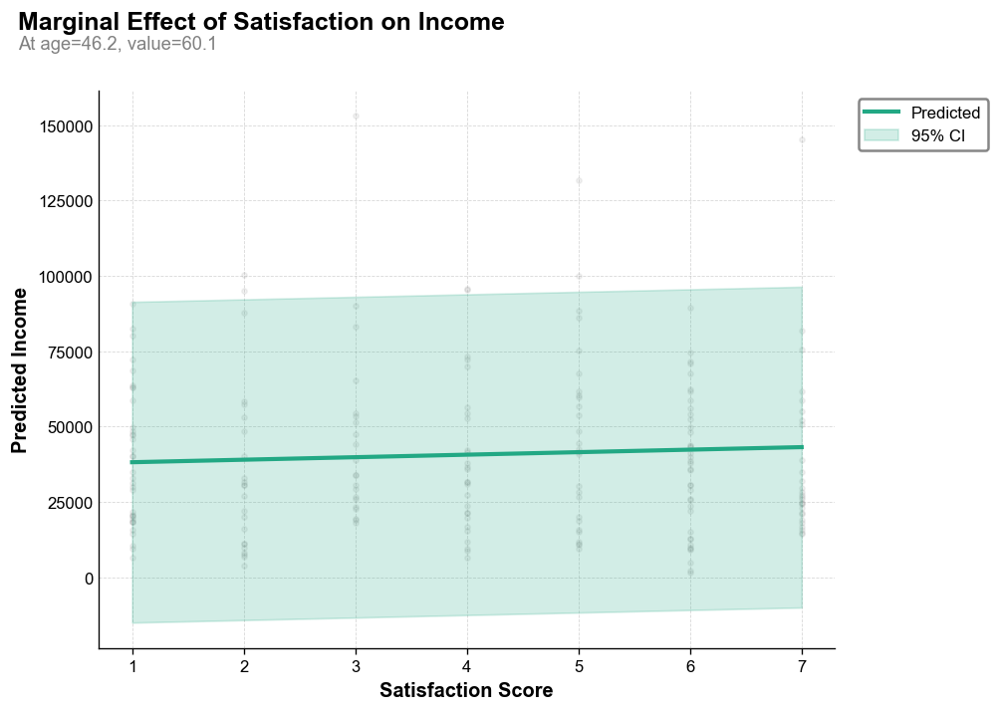

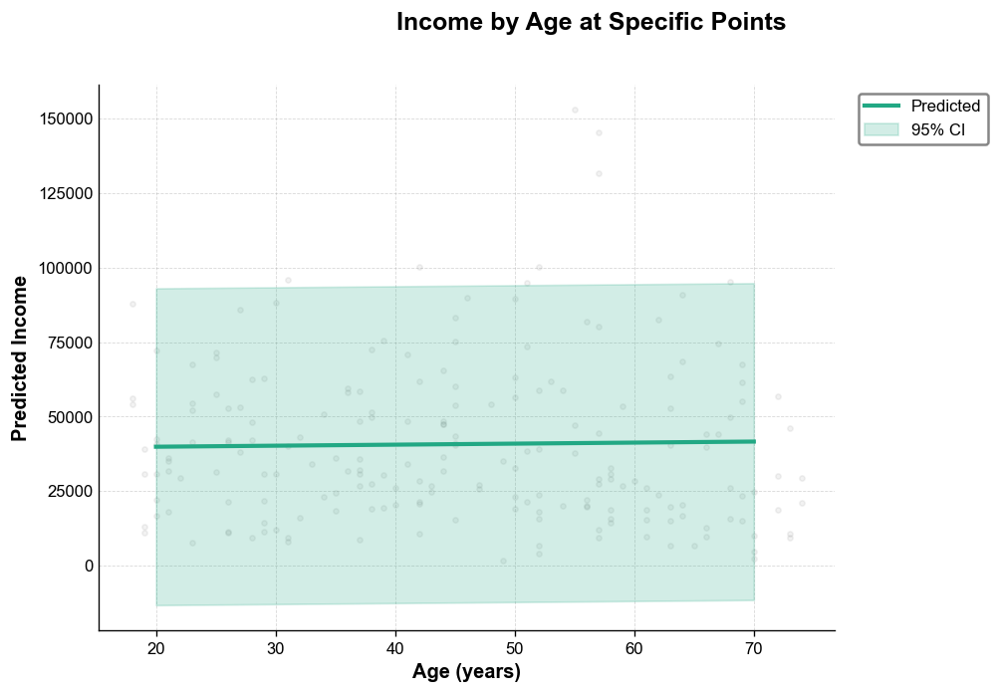

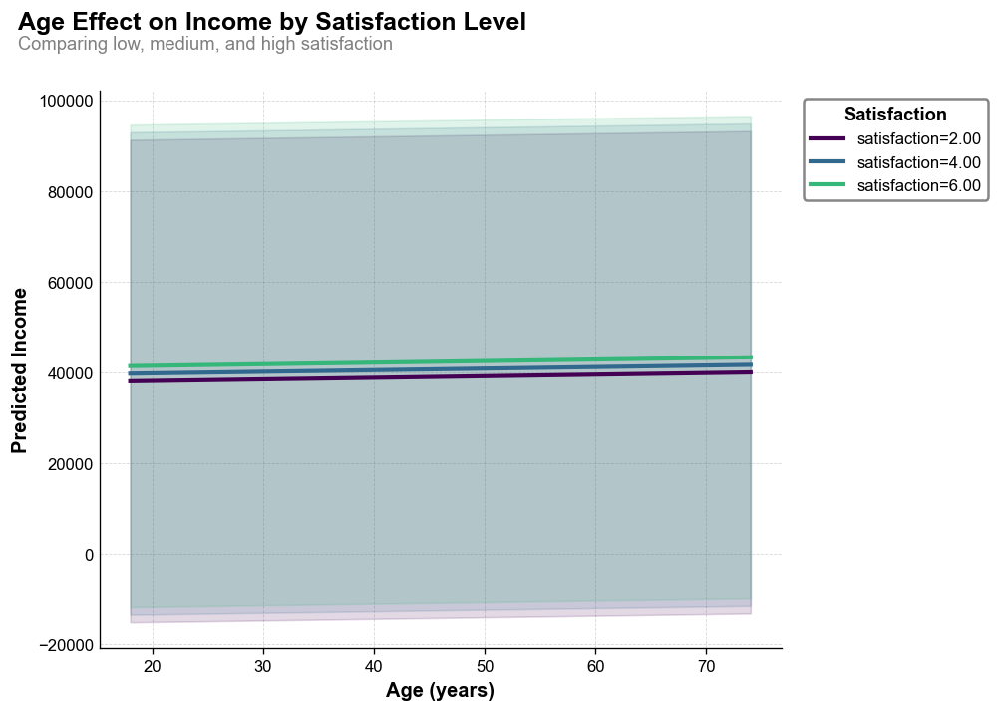

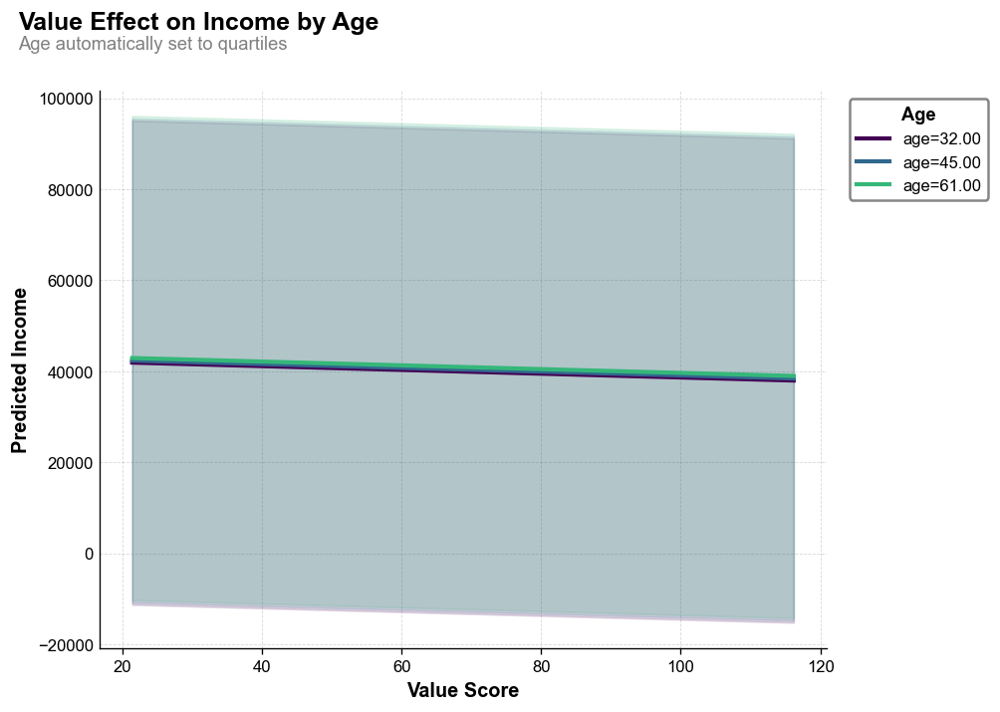

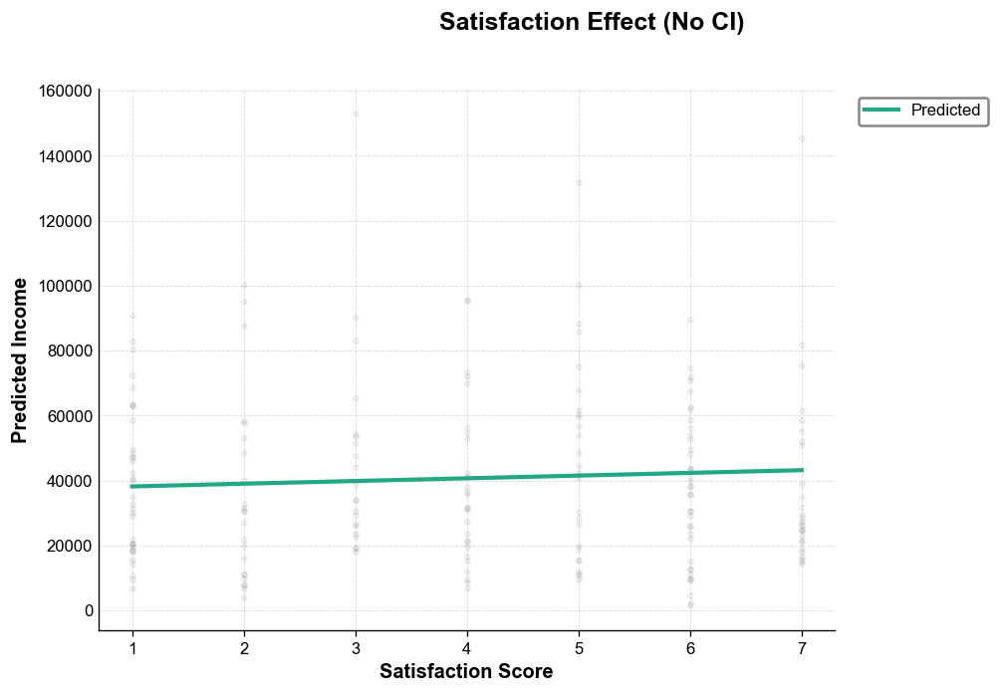

In [244]:
print("=" * 60)
print("TESTS 28-29: Marginal Effects Tests")
print("=" * 60)

import matplotlib.pyplot as plt
import sys

# Force fresh import
modules_to_remove = [key for key in sys.modules.keys() if 'margins' in key]
for module in modules_to_remove:
    del sys.modules[module]

from sociopathit.visuals.margins import (
    margins,
    margins_comparison,
    margins_interactive,
    margins_comparison_interactive
)

# Create model wrapper
class RegressionModelWrapper:
    """Wrapper to make statsmodels OLS work with margins functions."""
    def __init__(self, results, df, outcome, inputs):
        self.results = results
        self.df = df
        self.outcome = outcome
        self.inputs = inputs
        self.fixed = inputs

    def predict(self, newdata):
        """Generate predictions for new data."""
        return self.results.predict(newdata[self.inputs])

# Create wrapper with our OLS model
regression_model = RegressionModelWrapper(
    results=model_ols,
    df=df_continuous,
    outcome='income',
    inputs=['age', 'satisfaction', 'value']
)

# TEST 1: Simple margin plot
fig = margins(
    regression_model,
    variable='age',
    title='Marginal Effect of Age on Income',
    subtitle='Holding other variables at their means',
    xlabel='Age (years)',
    ylabel='Predicted Income',
    style_mode='viridis',
    ci=True
)
plt.show()
plt.close('all')

# TEST 2: Margin plot with specific values
mean_age = df_continuous['age'].mean()
mean_value = df_continuous['value'].mean()

fig = margins(
    regression_model,
    variable='satisfaction',
    other_vars={'age': mean_age, 'value': mean_value},
    title='Marginal Effect of Satisfaction on Income',
    subtitle=f'At age={mean_age:.1f}, value={mean_value:.1f}',
    xlabel='Satisfaction Score',
    ylabel='Predicted Income',
    style_mode='viridis',
    ci=True
)
plt.show()
plt.close('all')

# TEST 3: Margin plot with custom evaluation points
age_points = [20, 30, 40, 50, 60, 70]

fig = margins(
    regression_model,
    variable='age',
    at_values=age_points,
    title='Income by Age at Specific Points',
    xlabel='Age (years)',
    ylabel='Predicted Income',
    style_mode='viridis',
    ci=True
)
plt.show()
plt.close('all')

# TEST 4: Margin comparison plot
satisfaction_levels = [
    df_continuous['satisfaction'].quantile(0.25),
    df_continuous['satisfaction'].quantile(0.50),
    df_continuous['satisfaction'].quantile(0.75)
]

fig = margins_comparison(
    regression_model,
    variable='age',
    by='satisfaction',
    by_values=satisfaction_levels,
    title='Age Effect on Income by Satisfaction Level',
    subtitle='Comparing low, medium, and high satisfaction',
    xlabel='Age (years)',
    ylabel='Predicted Income',
    style_mode='viridis',
    ci=True
)
plt.show()
plt.close('all')

# TEST 5: Margin comparison (auto by_values)
fig = margins_comparison(
    regression_model,
    variable='value',
    by='age',
    title='Value Effect on Income by Age',
    subtitle='Age automatically set to quartiles',
    xlabel='Value Score',
    ylabel='Predicted Income',
    style_mode='viridis',
    ci=True
)
plt.show()
plt.close('all')

# TEST 6: Interactive margin plot
fig = margins_interactive(
    regression_model,
    variable='age',
    title='Interactive: Age Effect on Income',
    subtitle='Hover for exact values',
    style_mode='viridis',
    ci=True
)
fig.show()

# TEST 7: Interactive margin comparison
fig = margins_comparison_interactive(
    regression_model,
    variable='age',
    by='satisfaction',
    title='Interactive: Age Effect by Satisfaction',
    subtitle='Hover for exact predictions',
    style_mode='viridis',
    ci=True
)
fig.show()

# TEST 8: Margin plot without CI
fig = margins(
    regression_model,
    variable='satisfaction',
    title='Satisfaction Effect (No CI)',
    xlabel='Satisfaction Score',
    ylabel='Predicted Income',
    style_mode='viridis',
    ci=False
)
plt.show()
plt.close('all')

## 4.5 ICE Plots (Individual Conditional Expectation)

RANDOM FOREST MODEL
Training R²: 0.6768
TEST 30: ICE Plot


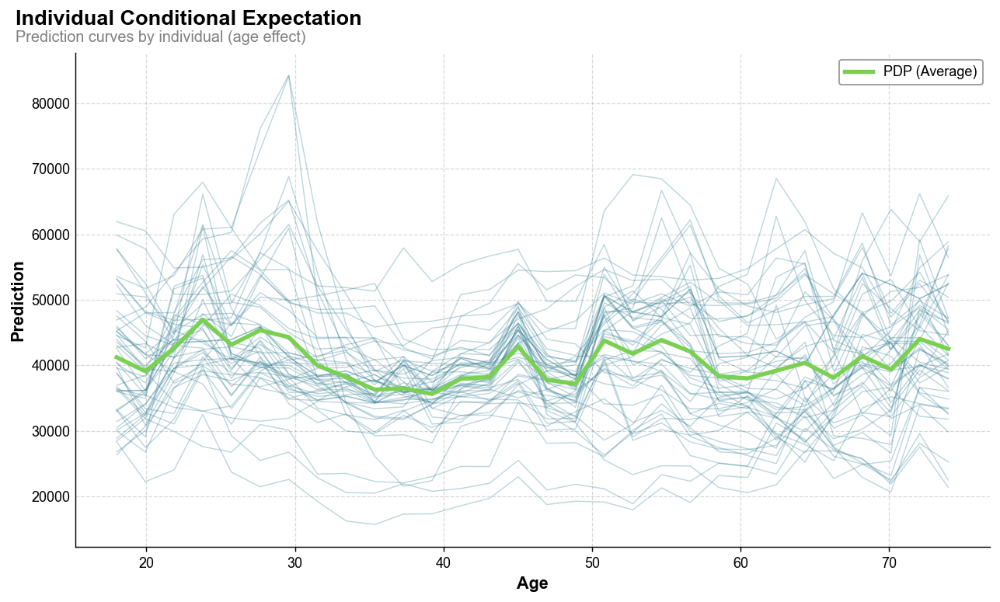

In [245]:
# Fit a sklearn model for ICE plots
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split

# Prepare data for sklearn
X = df_continuous[['age', 'satisfaction', 'value']].copy()
y = df_continuous['income'].copy()

# Fit Random Forest model
rf_model = RandomForestRegressor(n_estimators=50, random_state=42, max_depth=10)
rf_model.fit(X, y)

print("=" * 60)
print("RANDOM FOREST MODEL")
print("=" * 60)
print(f"Training R²: {rf_model.score(X, y):.4f}")
print("=" * 60)

from sociopathit.visuals import ice as ice_module
importlib.reload(ice_module)
from sociopathit.visuals.ice import ice, ice_interactive

print("=" * 60)
print("TEST 30: ICE Plot")
print("=" * 60)

fig = ice(
    rf_model,
    X,
    feature='age',
    n_points=30,
    sample_size=50,
    pdp=True,
    title='Individual Conditional Expectation',
    subtitle='Prediction curves by individual (age effect)',
    style_mode='viridis'
)

plt.close()

In [246]:
print("=" * 60)
print("TEST 31: Interactive ICE Plot")
print("=" * 60)

fig = ice_interactive(
    rf_model,
    X,
    feature='age',
    n_points=30,
    sample_size=50,
    pdp=True,
    title='Interactive ICE Plot',
    subtitle='Hover to explore individual predictions',
    style_mode='viridis'
)

fig.show()

TEST 31: Interactive ICE Plot


<a id='correlation'></a>
# 5. Correlation & Relationships

Test heatmaps, pair plots, and co-occurrence networks.

## 5.1 Heatmaps

TEST 32: Correlation Heatmap


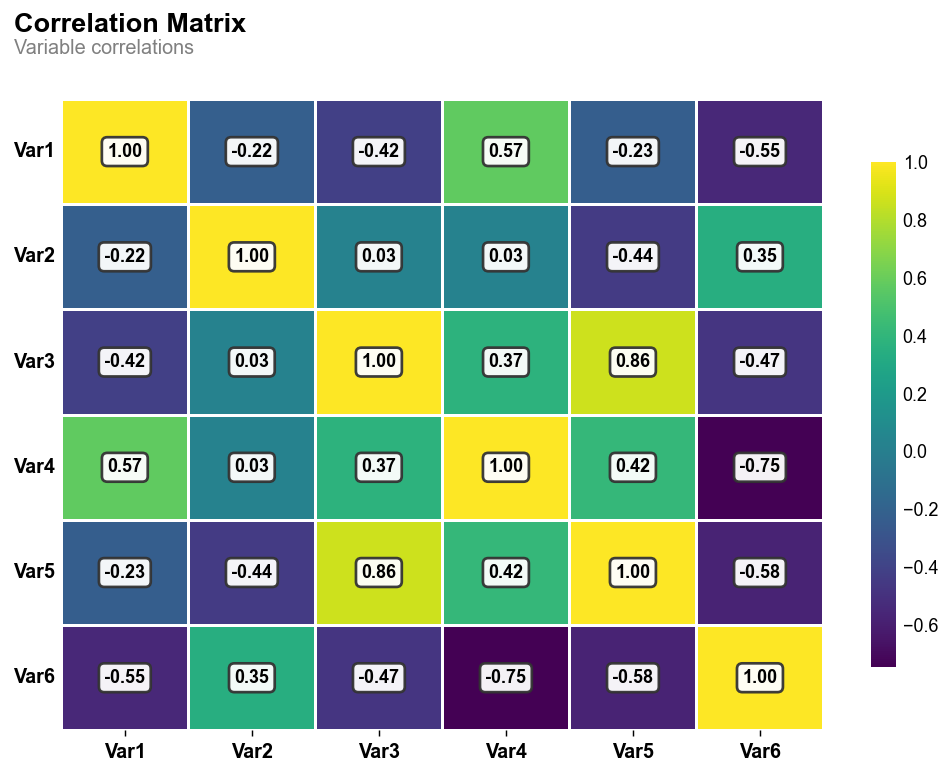

In [247]:
from sociopathit.visuals import heatmap as heatmap_module
importlib.reload(heatmap_module)
from sociopathit.visuals.heatmap import heatmap, heatmap_interactive

print("=" * 60)
print("TEST 32: Correlation Heatmap")
print("=" * 60)

fig, ax = heatmap(
    df_corr,
    title='Correlation Matrix',
    subtitle='Variable correlations',
    style_mode='viridis',
    annot=True
)

plt.close()

In [248]:
print("=" * 60)
print("TEST 33: Interactive Heatmap")
print("=" * 60)

fig = heatmap_interactive(
    df_corr,
    title='Interactive Correlation Heatmap',
    style_mode='viridis'
)

fig.show()

TEST 33: Interactive Heatmap


## 5.2 Pair Plots

TEST 34: Pair Plot


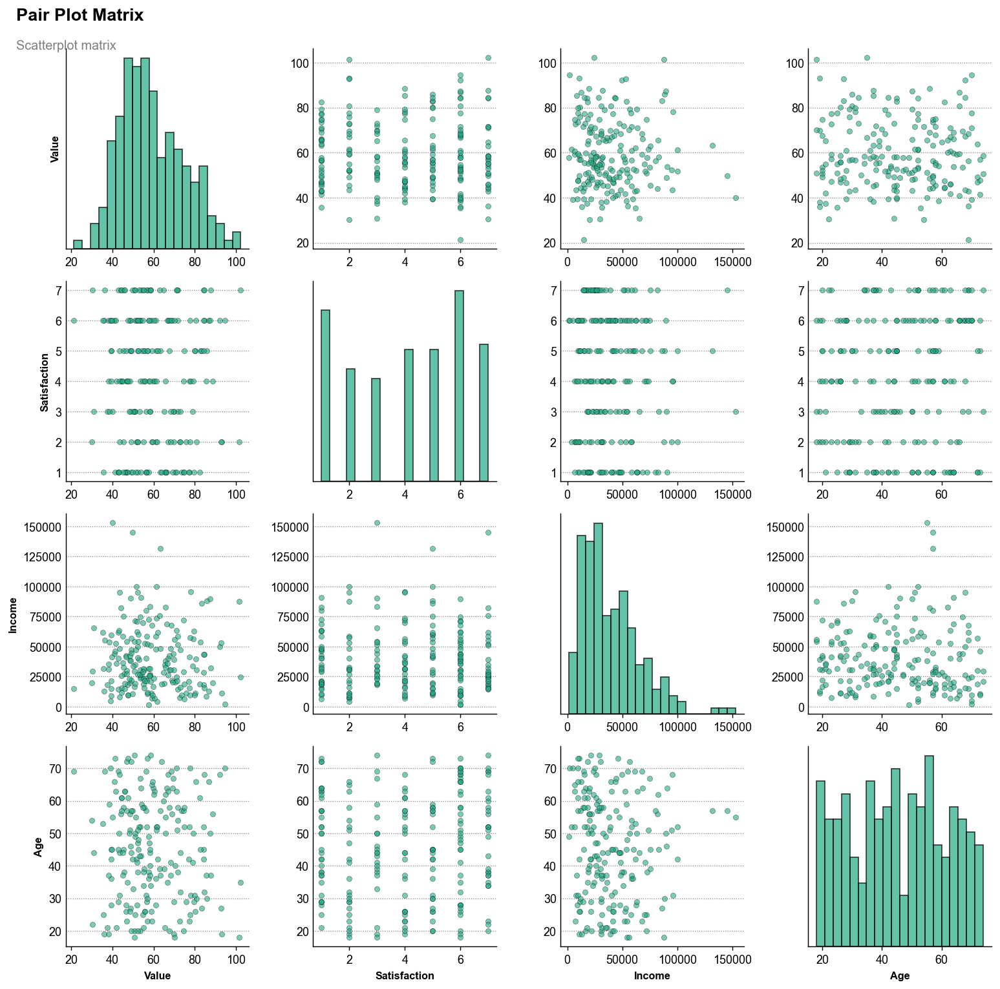

In [249]:
from sociopathit.visuals import pair as pair_module
importlib.reload(pair_module)
from sociopathit.visuals.pair import pair, pair_interactive

# Select subset for pair plot
df_pair = df_continuous[['value', 'satisfaction', 'income', 'age', 'group']].sample(200, random_state=42)

print("=" * 60)
print("TEST 34: Pair Plot")
print("=" * 60)

fig, axes = pair(
    df_pair.drop('group', axis=1),
    title='Pair Plot Matrix',
    subtitle='Scatterplot matrix',
    style_mode='viridis'
)

plt.close()

In [250]:
print("=" * 60)
print("TEST 35: Interactive Pair Plot")
print("=" * 60)

fig = pair_interactive(
    df_pair.drop('group', axis=1),
    title='Interactive Pair Plot',
    style_mode='viridis'
)

fig.show()

TEST 35: Interactive Pair Plot


## 5.3 Co-occurrence Networks

TESTS 36-37: Co-occurrence Network Visualization
Created sample dataset with 20 documents
Sample keywords: ['machine learning', 'artificial intelligence', 'neural networks']

------------------------------------------------------------
TEST 36a: Static Co-occurrence Network (Default)
------------------------------------------------------------


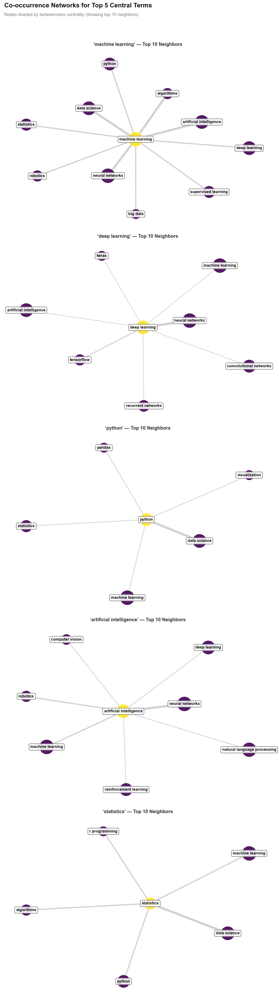

------------------------------------------------------------
TEST 36b: Static Co-occurrence Network (With Exclusions)
------------------------------------------------------------


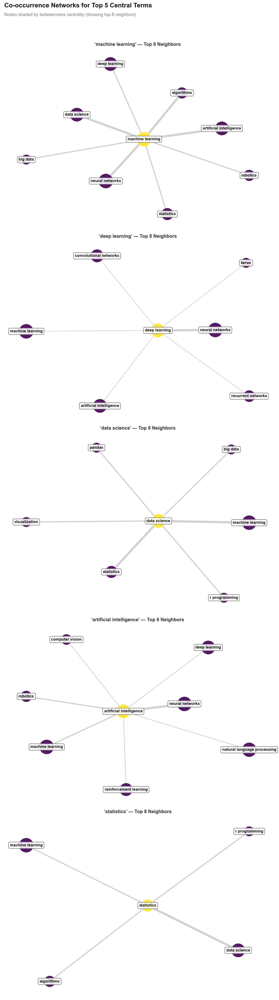

------------------------------------------------------------
TEST 36c: Static Co-occurrence Network (Density Mode)
------------------------------------------------------------


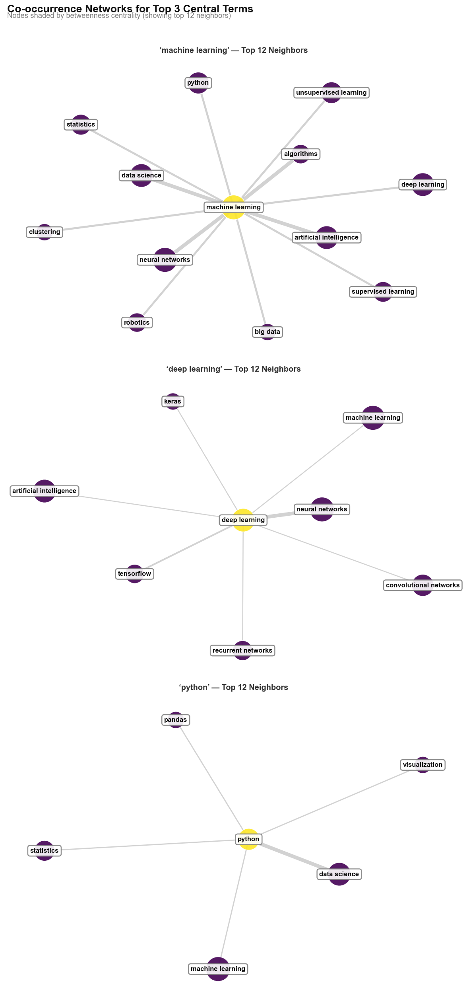

------------------------------------------------------------
TEST 36d: Static Co-occurrence Network (Top 3)
------------------------------------------------------------


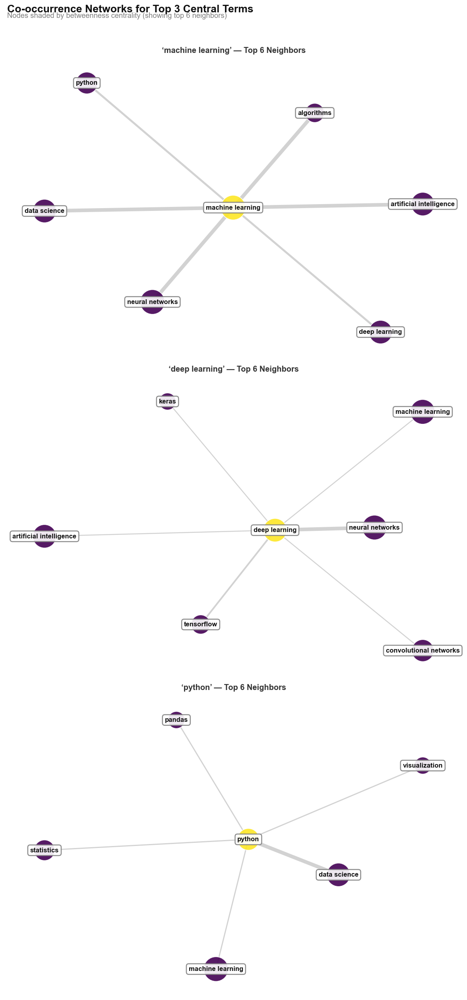

------------------------------------------------------------
TEST 37a: Interactive Co-occurrence Network
------------------------------------------------------------


------------------------------------------------------------
TEST 37b: Interactive Co-occurrence Network (Compact)
------------------------------------------------------------


------------------------------------------------------------
TEST 36e: Co-occurrence with String Format
------------------------------------------------------------


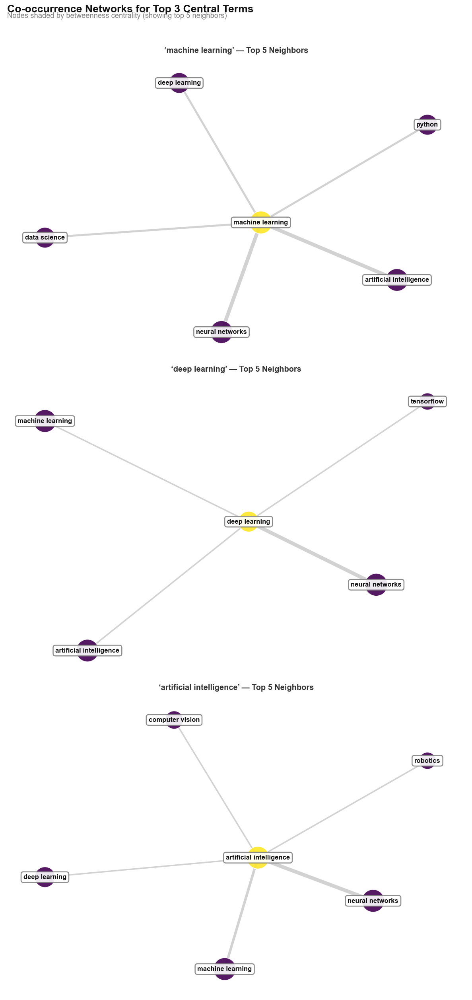

------------------------------------------------------------
TEST 36f: Error Handling (Empty Data)
------------------------------------------------------------
⚠️ No valid co-occurrences found.
✓ Correctly handled empty data


In [251]:
print("=" * 60)
print("TESTS 36-37: Co-occurrence Network Visualization")
print("=" * 60)

import sys
import matplotlib.pyplot as plt

# Force fresh import
modules_to_remove = [key for key in sys.modules.keys() if 'cooccur' in key]
for module in modules_to_remove:
    del sys.modules[module]

from sociopathit.visuals.cooccur import cooccur, cooccur_interactive

# Create sample text data with term co-occurrences
# Simulate a dataset of documents with associated terms/keywords
text_data = pd.DataFrame({
    'document_id': range(1, 21),
    'keywords': [
        ['machine learning', 'artificial intelligence', 'neural networks'],
        ['machine learning', 'data science', 'python'],
        ['artificial intelligence', 'deep learning', 'neural networks'],
        ['data science', 'statistics', 'python'],
        ['machine learning', 'deep learning', 'neural networks'],
        ['artificial intelligence', 'machine learning', 'robotics'],
        ['data science', 'visualization', 'python'],
        ['deep learning', 'neural networks', 'tensorflow'],
        ['machine learning', 'statistics', 'algorithms'],
        ['artificial intelligence', 'computer vision', 'neural networks'],
        ['data science', 'machine learning', 'big data'],
        ['deep learning', 'tensorflow', 'keras'],
        ['machine learning', 'supervised learning', 'algorithms'],
        ['artificial intelligence', 'natural language processing', 'neural networks'],
        ['data science', 'python', 'pandas'],
        ['deep learning', 'convolutional networks', 'neural networks'],
        ['machine learning', 'unsupervised learning', 'clustering'],
        ['artificial intelligence', 'reinforcement learning', 'robotics'],
        ['data science', 'statistics', 'r programming'],
        ['deep learning', 'recurrent networks', 'neural networks']
    ]
})

print(f"Created sample dataset with {len(text_data)} documents")
print(f"Sample keywords: {text_data['keywords'].iloc[0]}")
print()

# TEST 1: Static co-occurrence network (default settings)
print("-" * 60)
print("TEST 36a: Static Co-occurrence Network (Default)")
print("-" * 60)

cooccur(
    text_data,
    term_col='keywords',
    top_n=5,
    max_neighbors=10,
    style='reviewer3',
    figsize=(10, 7)
)

# TEST 2: Static co-occurrence network with exclusions
print("-" * 60)
print("TEST 36b: Static Co-occurrence Network (With Exclusions)")
print("-" * 60)

cooccur(
    text_data,
    term_col='keywords',
    top_n=5,
    exclude=['python', 'tensorflow'],  # Exclude common terms
    max_neighbors=8,
    style='reviewer3',
    figsize=(10, 7)
)

# TEST 3: Static co-occurrence network (density mode)
print("-" * 60)
print("TEST 36c: Static Co-occurrence Network (Density Mode)")
print("-" * 60)

cooccur(
    text_data,
    term_col='keywords',
    top_n=3,
    max_neighbors=12,
    style='reviewer3',
    figsize=(10, 7),
    density_mode=True
)

# TEST 4: Static co-occurrence network (fewer top terms)
print("-" * 60)
print("TEST 36d: Static Co-occurrence Network (Top 3)")
print("-" * 60)

cooccur(
    text_data,
    term_col='keywords',
    top_n=3,
    max_neighbors=6,
    style='reviewer3',
    figsize=(10, 7)
)

# TEST 5: Interactive co-occurrence network
print("-" * 60)
print("TEST 37a: Interactive Co-occurrence Network")
print("-" * 60)

fig = cooccur_interactive(
    text_data,
    term_col='keywords',
    top_n=5,
    max_neighbors=8,
    style='reviewer3',
    width=900,
    height_per_network=500
)
fig.show()

# TEST 6: Interactive co-occurrence network (compact)
print("-" * 60)
print("TEST 37b: Interactive Co-occurrence Network (Compact)")
print("-" * 60)

fig = cooccur_interactive(
    text_data,
    term_col='keywords',
    top_n=3,
    max_neighbors=6,
    style='reviewer3',
    width=800,
    height_per_network=400
)
fig.show()

# TEST 7: Test with comma-separated string format (alternative input)
print("-" * 60)
print("TEST 36e: Co-occurrence with String Format")
print("-" * 60)

# Create data with comma-separated strings instead of lists
text_data_strings = pd.DataFrame({
    'document_id': range(1, 11),
    'keywords': [
        'machine learning, artificial intelligence, neural networks',
        'machine learning, data science, python',
        'artificial intelligence, deep learning, neural networks',
        'data science, statistics, python',
        'machine learning, deep learning, neural networks',
        'artificial intelligence, machine learning, robotics',
        'data science, visualization, python',
        'deep learning, neural networks, tensorflow',
        'machine learning, statistics, algorithms',
        'artificial intelligence, computer vision, neural networks'
    ]
})

cooccur(
    text_data_strings,
    term_col='keywords',
    top_n=3,
    max_neighbors=5,
    style='reviewer3',
    figsize=(10, 7)
)

# TEST 8: Error handling - empty data
print("-" * 60)
print("TEST 36f: Error Handling (Empty Data)")
print("-" * 60)

empty_data = pd.DataFrame({'keywords': [[], [], []]})
result = cooccur(
    empty_data,
    term_col='keywords',
    top_n=3,
    style='reviewer3'
)
if result is None:
    print("✓ Correctly handled empty data")

In [252]:
# Skipped - see TEST 36

<a id='hierarchical'></a>
# 6. Hierarchical & Clustering

Test dendrograms, cluster heatmaps, treemaps, and sunburst charts.

## 6.1 Cluster Dendrograms

TEST 38: Hierarchical Cluster Dendrogram


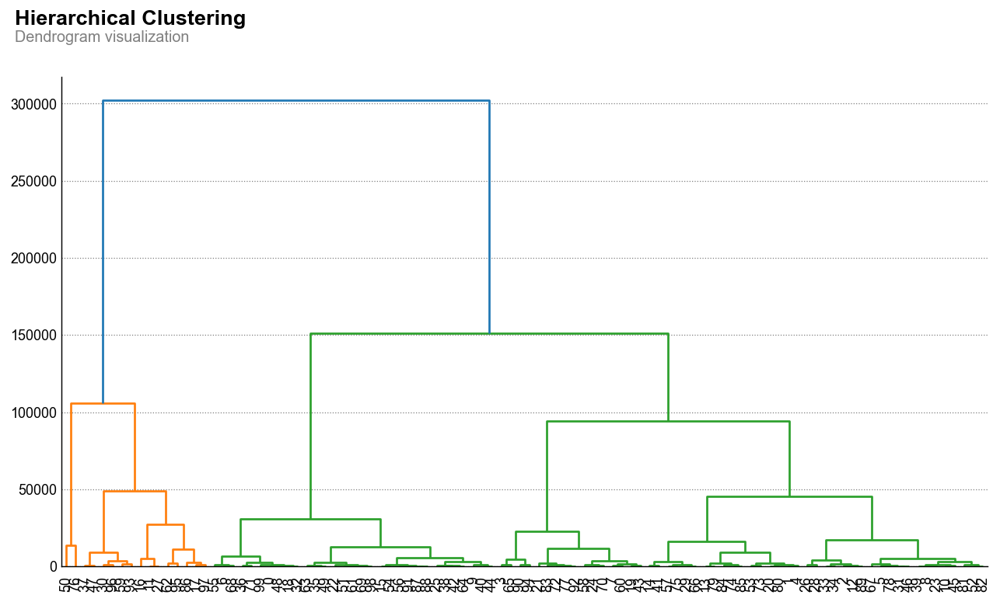

In [253]:
from sociopathit.visuals import cluster as cluster_module
importlib.reload(cluster_module)
from sociopathit.visuals.cluster import cluster, cluster_interactive, heatmap_cluster

# Prepare clustering data
df_cluster = df_continuous[['value', 'satisfaction', 'income', 'age']].sample(100, random_state=42)

print("=" * 60)
print("TEST 38: Hierarchical Cluster Dendrogram")
print("=" * 60)

fig, ax = cluster(
    df_cluster,
    title='Hierarchical Clustering',
    subtitle='Dendrogram visualization',
    style_mode='viridis'
)

plt.close()

TEST 39: Heatmap with Clustering


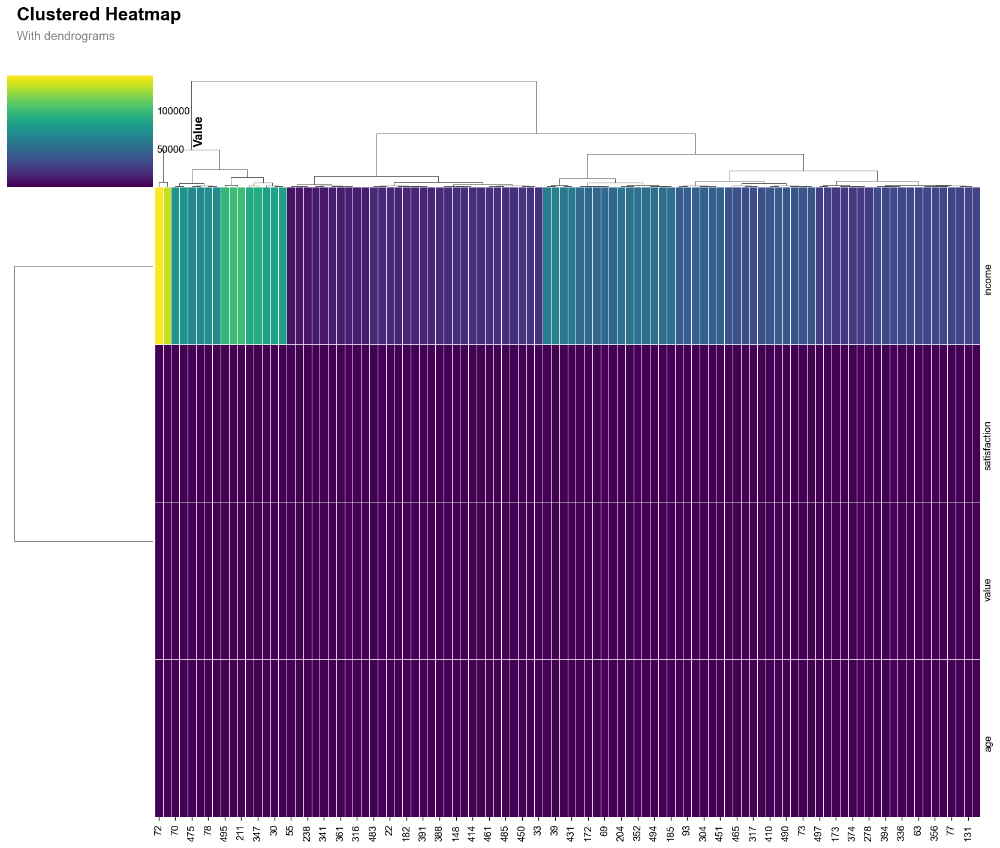

In [254]:
print("=" * 60)
print("TEST 39: Heatmap with Clustering")
print("=" * 60)

fig, ax = heatmap_cluster(
    df_cluster.T,
    title='Clustered Heatmap',
    subtitle='With dendrograms',
    style_mode='viridis'
)

plt.close()

In [255]:
print("=" * 60)
print("TEST 40: Interactive Cluster Dendrogram")
print("=" * 60)

fig = cluster_interactive(
    df_cluster,
    title='Interactive Dendrogram',
    style_mode='viridis'
)

fig.show()

TEST 40: Interactive Cluster Dendrogram


## 6.2 Treemaps and Sunbursts

TEST 41: Treemap


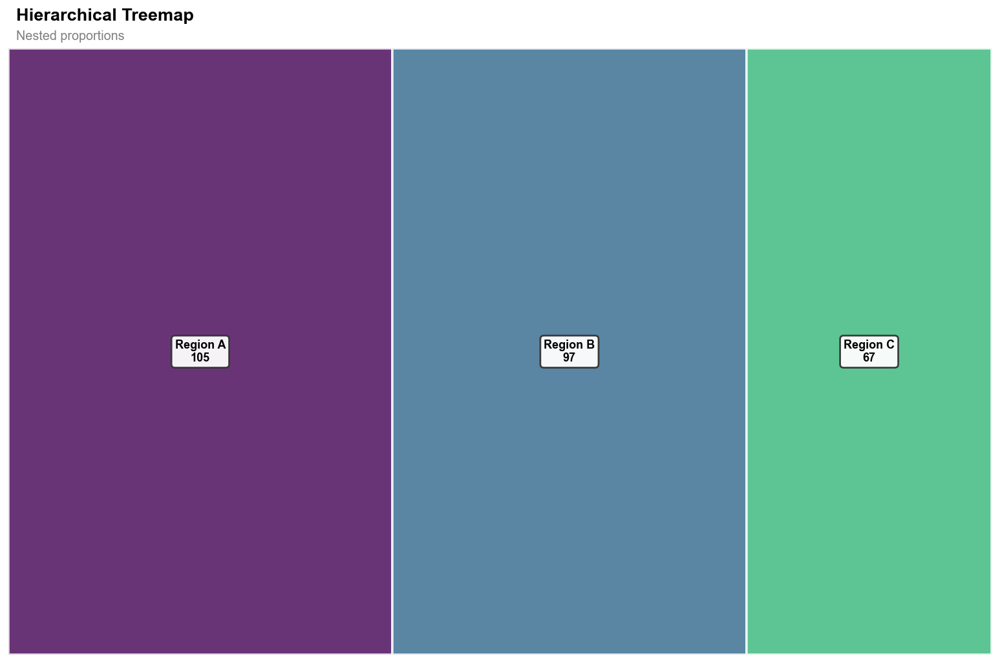

In [256]:
from sociopathit.visuals import hierarchical as hier_module
importlib.reload(hier_module)
from sociopathit.visuals.hierarchical import treemap, treemap_interactive, sunburst, sunburst_interactive

# Create hierarchical data
df_hier = pd.DataFrame({
    'category': ['Region A', 'Region A', 'Region A', 'Region B', 'Region B', 'Region C'],
    'subcategory': ['Sub1', 'Sub2', 'Sub3', 'Sub1', 'Sub2', 'Sub1'],
    'value': [45, 32, 28, 56, 41, 67]
})

print("=" * 60)
print("TEST 41: Treemap")
print("=" * 60)

fig = treemap(
    df_hier,
    hierarchy=['category'],
    values='value',
    title='Hierarchical Treemap',
    subtitle='Nested proportions',
    style_mode='viridis'
)

plt.close()

In [257]:
print("=" * 60)
print("TEST 42: Interactive Treemap")
print("=" * 60)

fig = treemap_interactive(
    df_hier,
    hierarchy=['category', 'subcategory'],
    values='value',
    title='Interactive Treemap',
    style_mode='viridis'
)

fig.show()

TEST 42: Interactive Treemap


TEST 43: Sunburst Chart


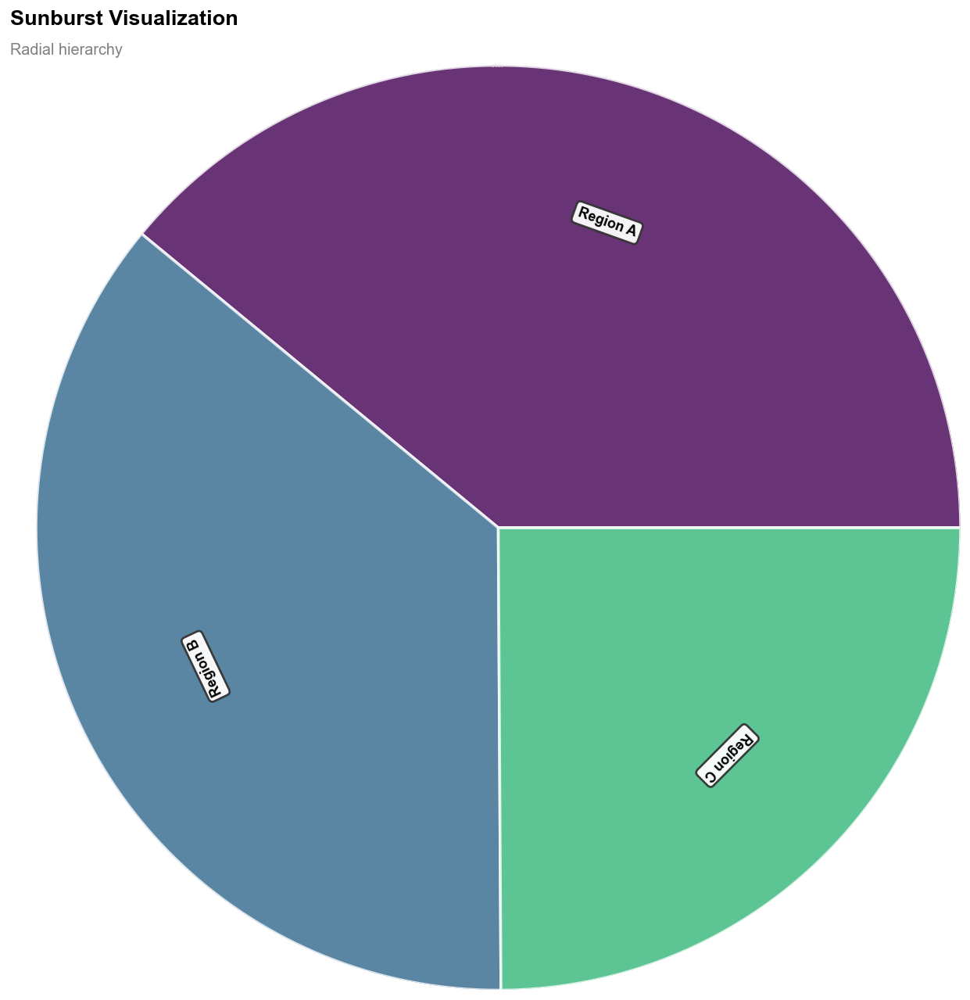

In [258]:
print("=" * 60)
print("TEST 43: Sunburst Chart")
print("=" * 60)

fig = sunburst(
    df_hier,
    hierarchy=['category'],
    values='value',
    title='Sunburst Visualization',
    subtitle='Radial hierarchy',
    style_mode='viridis'
)

plt.close()

In [259]:
print("=" * 60)
print("TEST 44: Interactive Sunburst")
print("=" * 60)

fig = sunburst_interactive(
    df_hier,
    hierarchy=['category', 'subcategory'],
    values='value',
    title='Interactive Sunburst',
    style_mode='viridis'
)

fig.show()

TEST 44: Interactive Sunburst


<a id='temporal'></a>
# 7. Temporal & Trends

Test trend lines and horizon charts for time series data.

## 7.1 Trend Lines

TEST 45: Trend Line Chart


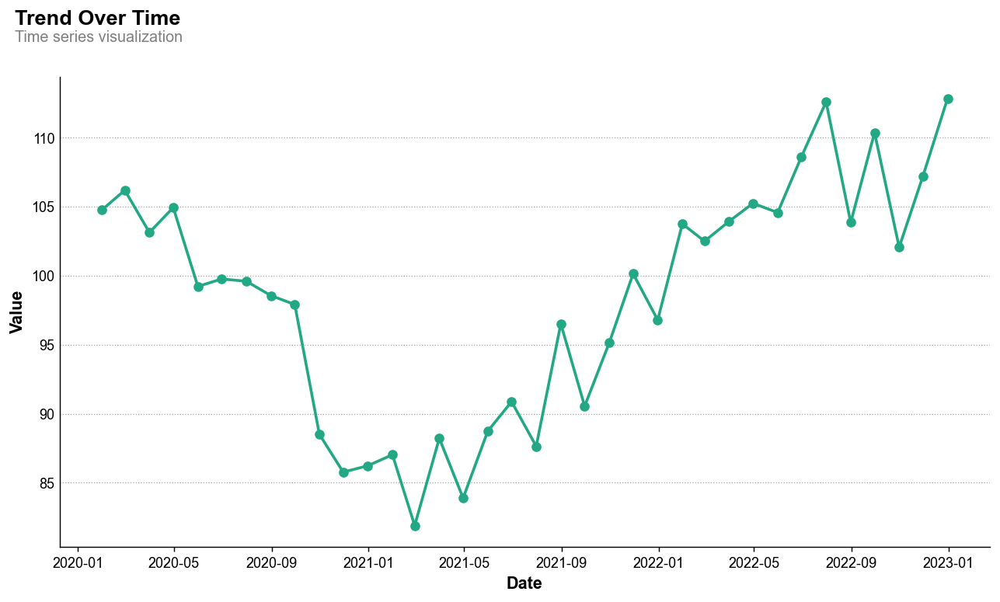

In [260]:
from sociopathit.visuals import trend as trend_module
importlib.reload(trend_module)
from sociopathit.visuals.trend import trend, trend_interactive

print("=" * 60)
print("TEST 45: Trend Line Chart")
print("=" * 60)

fig, ax = trend(
    df_temporal,
    x='date',
    y='value',
    title='Trend Over Time',
    subtitle='Time series visualization',
    style_mode='viridis'
)

plt.close()

In [261]:
print("=" * 60)
print("TEST 46: Interactive Trend Chart")
print("=" * 60)

fig = trend_interactive(
    df_temporal,
    x='date',
    y='value',
    title='Interactive Trend',
    style_mode='viridis'
)

fig.show()

TEST 46: Interactive Trend Chart


## 7.2 Horizon Charts

TEST 47: Single Horizon Chart


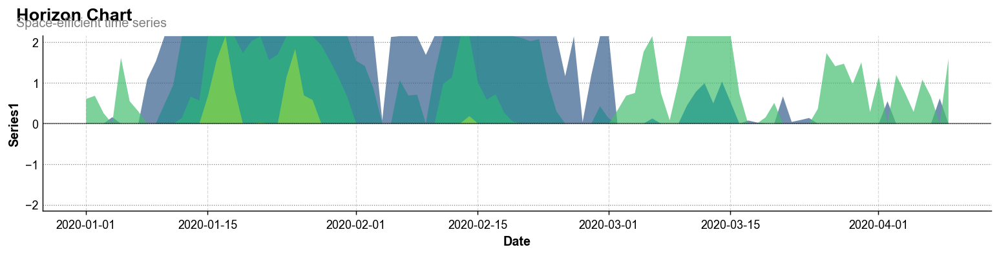

In [262]:
from sociopathit.visuals import horizon as horizon_module
importlib.reload(horizon_module)
from sociopathit.visuals.horizon import horizon, horizon_panel, horizon_interactive

# Create multiple time series
dates = pd.date_range('2020-01-01', periods=100, freq='D')
df_horizon = pd.DataFrame({
    'date': dates,
    'series1': np.cumsum(np.random.randn(100)),
    'series2': np.cumsum(np.random.randn(100)),
    'series3': np.cumsum(np.random.randn(100))
})

print("=" * 60)
print("TEST 47: Single Horizon Chart")
print("=" * 60)

fig = horizon(
    df_horizon,
    x='date',
    y='series1',
    title='Horizon Chart',
    subtitle='Space-efficient time series',
    style_mode='viridis'
)

plt.close()

TEST 48: Horizon Chart Panel


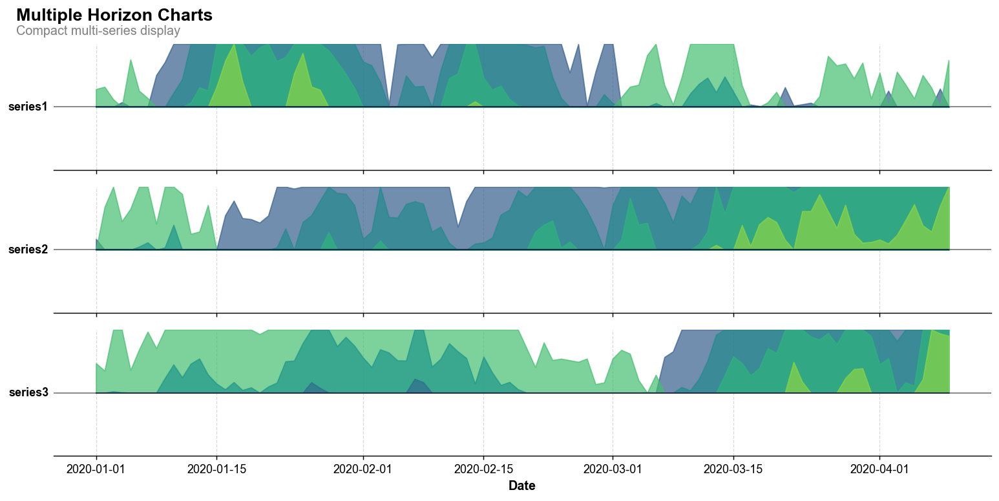

In [263]:
print("=" * 60)
print("TEST 48: Horizon Chart Panel")
print("=" * 60)

# Reshape data to long form for horizon_panel
df_horizon_long = pd.melt(
    df_horizon,
    id_vars=['date'],
    value_vars=['series1', 'series2', 'series3'],
    var_name='series',
    value_name='value'
)

fig = horizon_panel(
    df_horizon_long,
    x='date',
    y='value',
    group='series',
    title='Multiple Horizon Charts',
    subtitle='Compact multi-series display',
    style_mode='viridis'
)

plt.close()

In [264]:
print("=" * 60)
print("TEST 49: Interactive Horizon Chart")
print("=" * 60)

fig = horizon_interactive(
    df_horizon,
    x='date',
    y='series1',
    title='Interactive Horizon',
    style_mode='viridis'
)

fig.show()

TEST 49: Interactive Horizon Chart


## 7.3 Age-Period-Cohort Maps

TEST 1: APC Rectangular Heatmap - Viridis Style


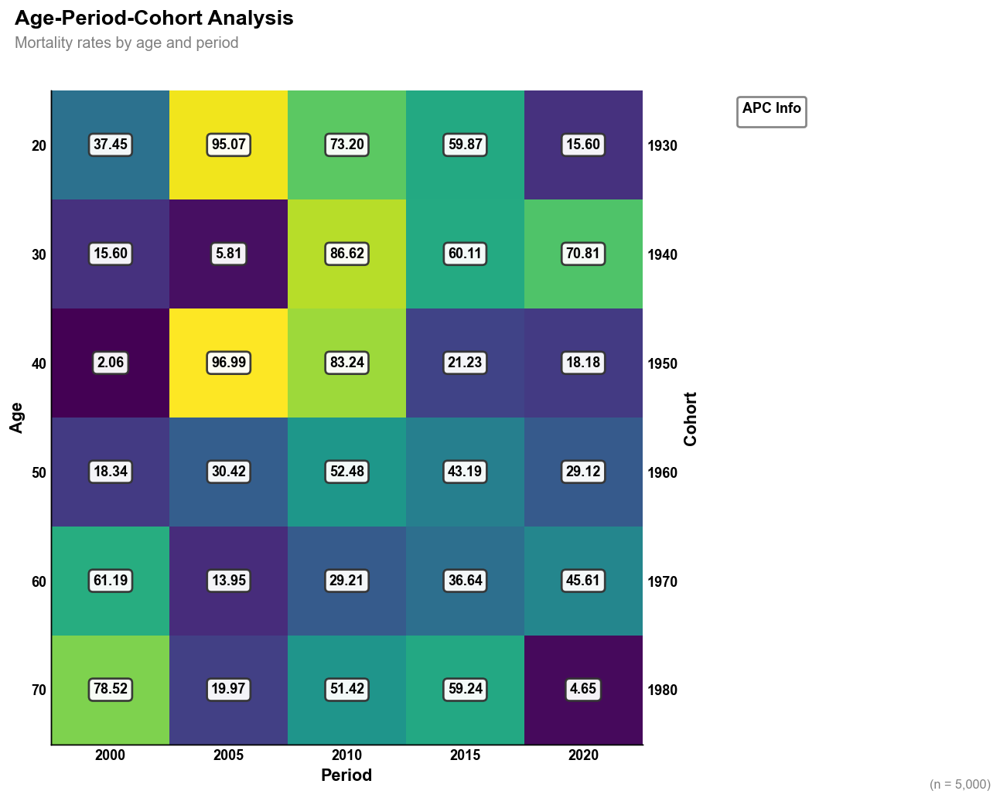

In [265]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import importlib
from sociopathit.visuals import apc
importlib.reload(apc)
from sociopathit.visuals.apc import apc_heatmap, apc_heatmap_interactive

# ══════════════════════════════════════════════════════════════════════════════
# SETUP: Generate sample APC data
# ══════════════════════════════════════════════════════════════════════════════

ages = [20, 30, 40, 50, 60, 70]
periods = [2000, 2005, 2010, 2015, 2020]
cohorts = [1930, 1940, 1950, 1960, 1970, 1980]

# Create sample data matrix (ages x periods)
np.random.seed(42)
data = np.random.rand(len(ages), len(periods)) * 100

print("=" * 70)
print("TEST 1: APC Rectangular Heatmap - Viridis Style")
print("=" * 70)

fig, ax = apc_heatmap(
    data=data,
    ages=ages,
    periods=periods,
    cohorts=cohorts,
    layout="rectangular",
    title="Age-Period-Cohort Analysis",
    subtitle="Mortality rates by age and period",
    n=5000,
    show_values=True,
    show_legend=True,
    style_mode="viridis"
)

plt.close()

TEST 2: APC Rectangular Heatmap - Fiery Style with Period Highlight


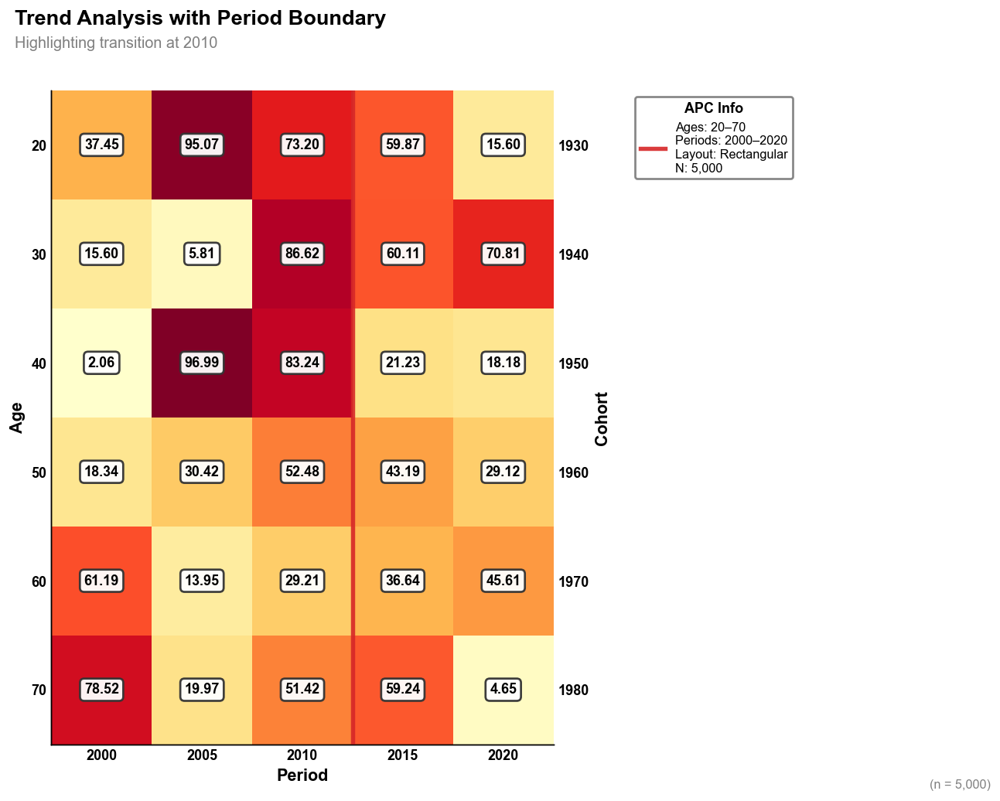

In [266]:
print("=" * 70)
print("TEST 2: APC Rectangular Heatmap - Fiery Style with Period Highlight")
print("=" * 70)

fig, ax = apc_heatmap(
    data=data,
    ages=ages,
    periods=periods,
    cohorts=cohorts,
    layout="rectangular",
    title="Trend Analysis with Period Boundary",
    subtitle="Highlighting transition at 2010",
    n=5000,
    show_values=True,
    show_legend=True,
    style_mode="fiery",
    highlight_periods=2  # Vertical line after 3rd period
)

plt.close()

TEST 3: APC Rectangular Heatmap - Sentiment Style with Diagonal Highlight


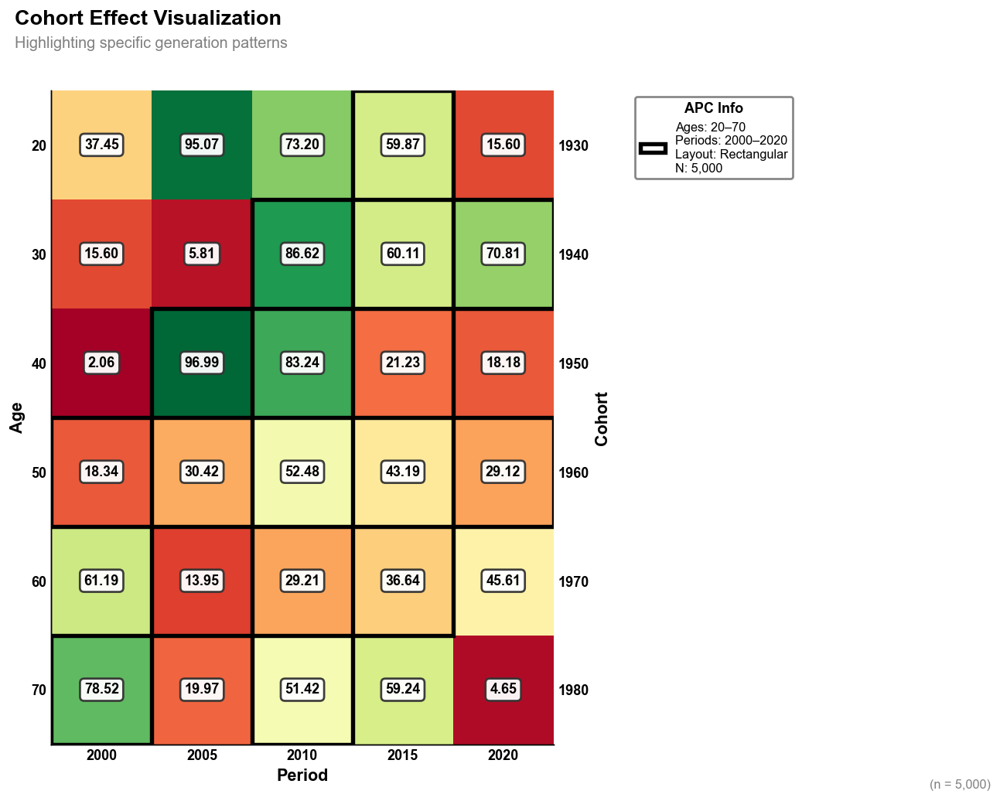

In [267]:
print("=" * 70)
print("TEST 3: APC Rectangular Heatmap - Sentiment Style with Diagonal Highlight")
print("=" * 70)

fig, ax = apc_heatmap(
    data=data,
    ages=ages,
    periods=periods,
    cohorts=cohorts,
    layout="rectangular",
    title="Cohort Effect Visualization",
    subtitle="Highlighting specific generation patterns",
    n=5000,
    show_values=True,
    show_legend=True,
    style_mode="sentiment",
    highlight_diagonals=[3, 5, 7]  # Multiple diagonal highlights
)

plt.close()

TEST 4: APC Rectangular Heatmap - Plain Jane Style (No Values)


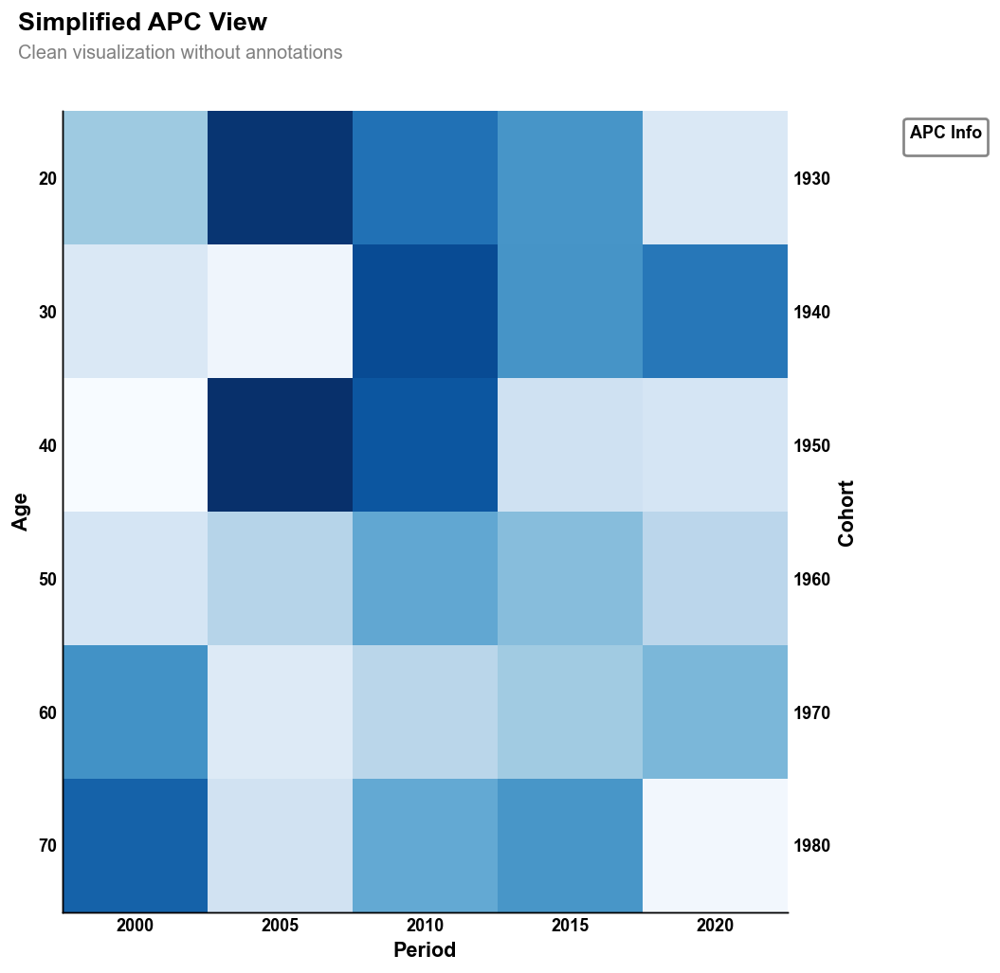

In [268]:
print("=" * 70)
print("TEST 4: APC Rectangular Heatmap - Plain Jane Style (No Values)")
print("=" * 70)

fig, ax = apc_heatmap(
    data=data,
    ages=ages,
    periods=periods,
    cohorts=cohorts,
    layout="rectangular",
    title="Simplified APC View",
    subtitle="Clean visualization without annotations",
    show_values=False,
    show_legend=True,
    style_mode="plainjane"
)

plt.close()

TEST 5: APC Rectangular Heatmap - Reviewer3 Style (Grayscale)


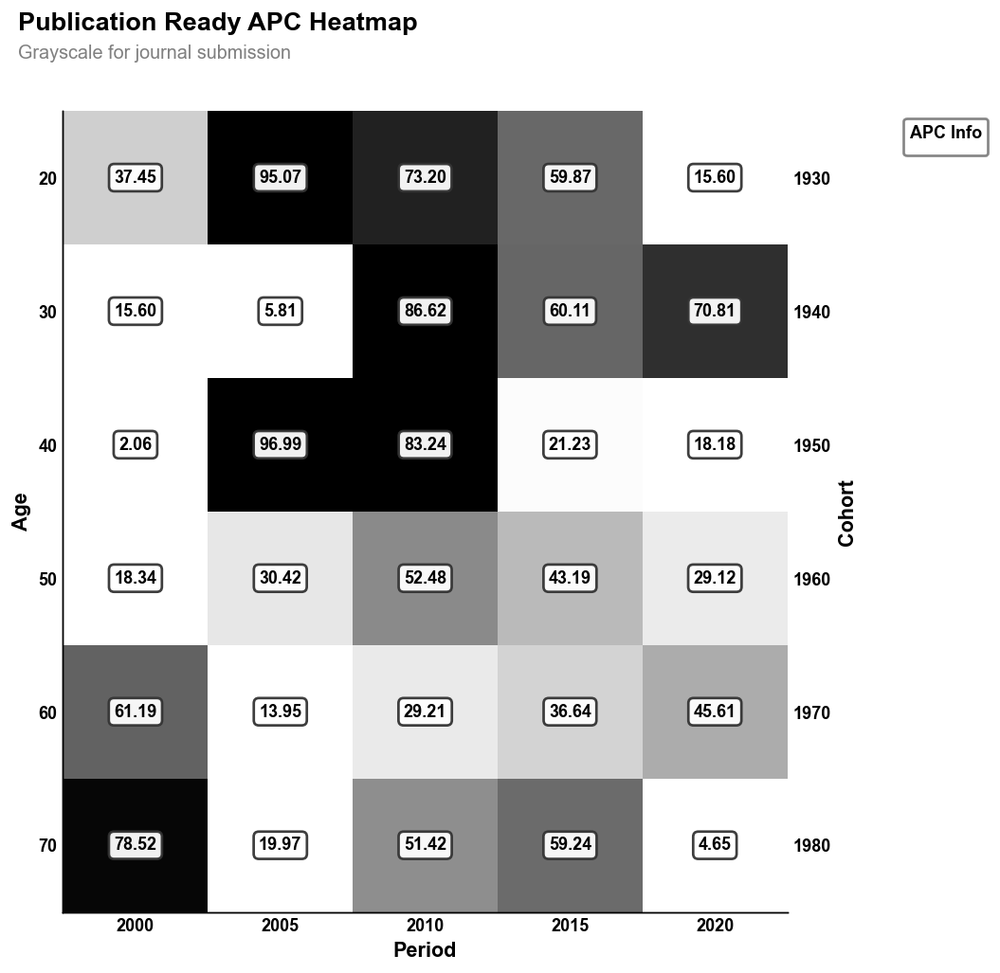

In [269]:
print("=" * 70)
print("TEST 5: APC Rectangular Heatmap - Reviewer3 Style (Grayscale)")
print("=" * 70)

fig, ax = apc_heatmap(
    data=data,
    ages=ages,
    periods=periods,
    cohorts=cohorts,
    layout="rectangular",
    title="Publication Ready APC Heatmap",
    subtitle="Grayscale for journal submission",
    show_values=True,
    show_legend=True,
    style_mode="reviewer3",
    vmin=20,
    vmax=80  # Specify custom value range
)

plt.close()

TEST 6: APC Hexagonal Layout - Viridis Style (Lexis Diagram)


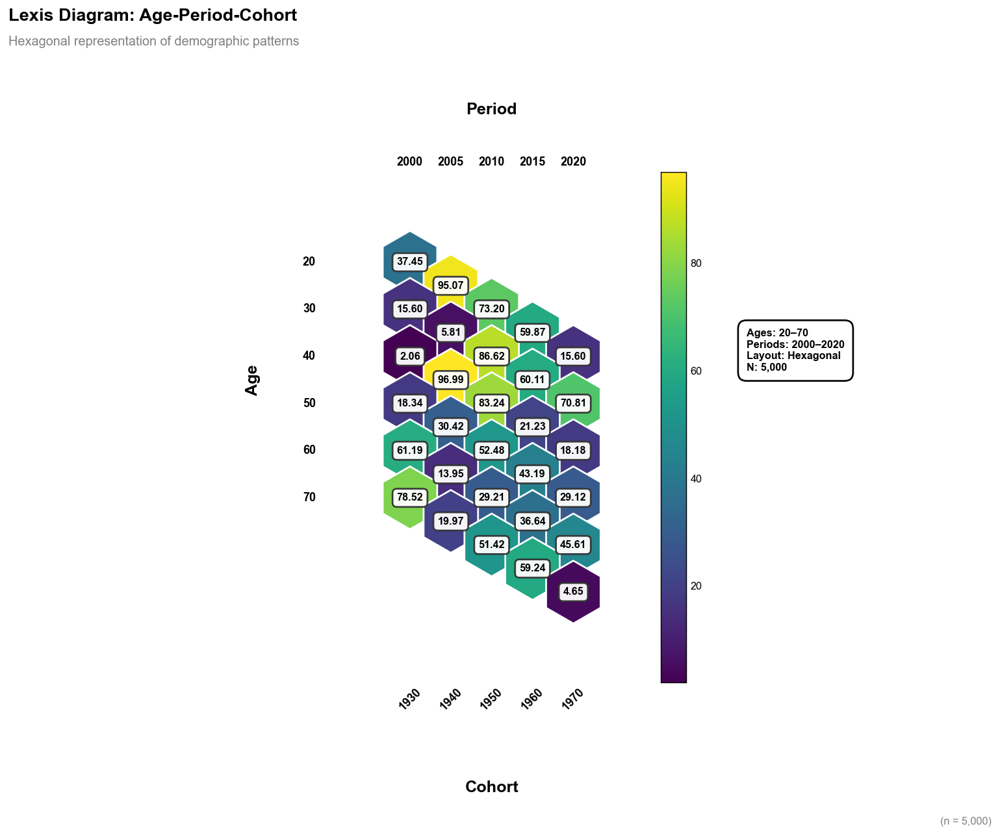

In [270]:
print("=" * 70)
print("TEST 6: APC Hexagonal Layout - Viridis Style (Lexis Diagram)")
print("=" * 70)

fig, ax = apc_heatmap(
    data=data,
    ages=ages,
    periods=periods,
    cohorts=cohorts,
    layout="hexagonal",
    title="Lexis Diagram: Age-Period-Cohort",
    subtitle="Hexagonal representation of demographic patterns",
    n=5000,
    show_values=True,
    show_legend=True,
    style_mode="viridis"
)

plt.close()

<a id='geospatial'></a>
# 8. Geospatial Visualizations

Test geographic maps, choropleths, and hexbin density maps.

## 8.1 Point Maps

TEST 50: Point Map


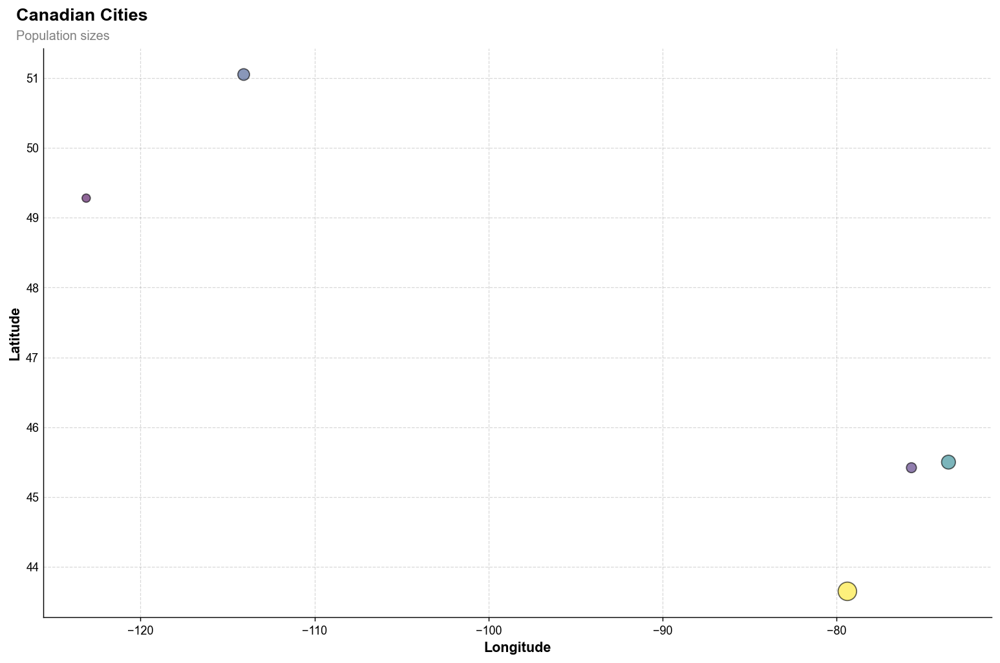

In [271]:
from sociopathit.visuals import geographic as geo_module
importlib.reload(geo_module)
from sociopathit.visuals.geographic import point_map, point_map_interactive

print("=" * 60)
print("TEST 50: Point Map")
print("=" * 60)

fig = point_map(
    df_geo,
    lat='lat',
    lon='lon',
    value='value',
    title='Canadian Cities',
    subtitle='Population sizes',
    style_mode='viridis'
)

plt.close()

In [272]:
print("=" * 60)
print("TEST 51: Interactive Point Map")
print("=" * 60)

fig = point_map_interactive(
    df_geo,
    lat='lat',
    lon='lon',
    value='value',
    hover_data=['city'],
    title='Interactive Map',
    style_mode='viridis'
)

fig.show()

TEST 51: Interactive Point Map


## 8.2 Choropleth Maps

In [273]:
from sociopathit.visuals.geographic import choropleth_interactive

# Note: Choropleth requires GeoJSON data
print("=" * 60)
print("TEST 52: Choropleth Map (Requires GeoJSON)")
print("=" * 60)
print("Choropleth visualization requires GeoJSON data.")
print("See documentation for examples with regional data.")

TEST 52: Choropleth Map (Requires GeoJSON)
Choropleth visualization requires GeoJSON data.
See documentation for examples with regional data.


<a id='network'></a>
# 9. Network & Flow Diagrams

Test DAGs, Sankey diagrams, and alluvial plots.

## 9.1 Directed Acyclic Graphs (DAGs)

TEST 53: DAG Visualization
Using enhanced custom hierarchical layout


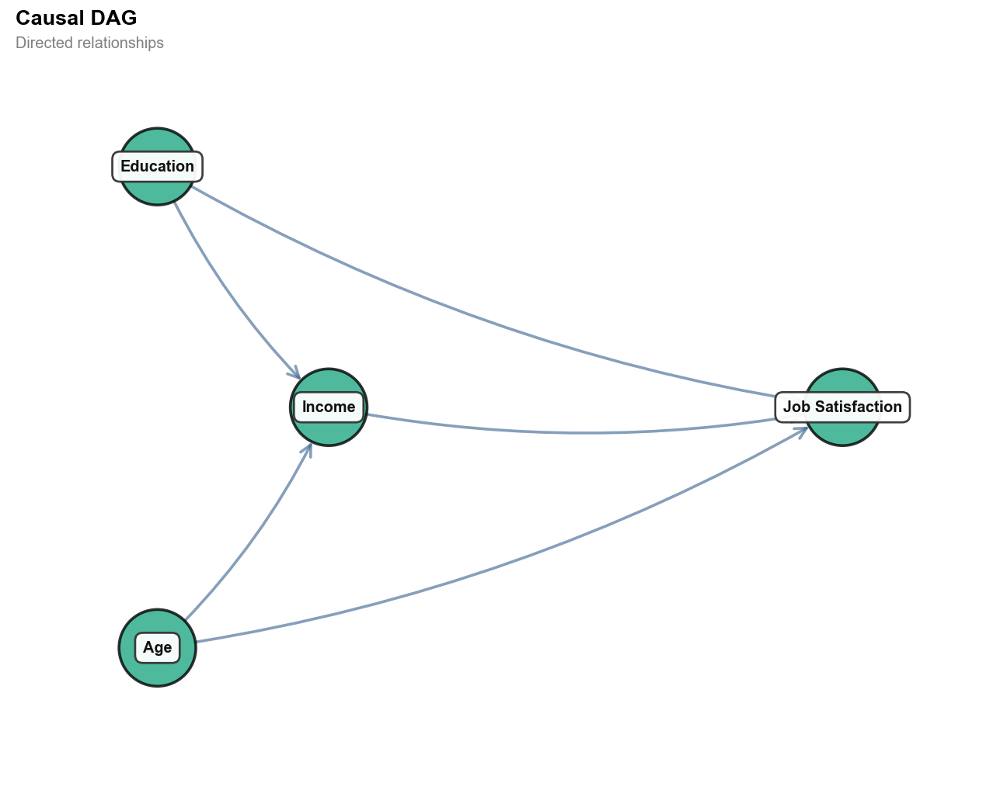

In [274]:
from sociopathit.visuals import dag as dag_module
importlib.reload(dag_module)
from sociopathit.visuals.dag import dag, dag_from_formula, dag_interactive

# Define DAG structure
dag_nodes = ['Education', 'Income', 'Job Satisfaction', 'Age']
dag_edges = [
    ('Education', 'Income'),
    ('Education', 'Job Satisfaction'),
    ('Income', 'Job Satisfaction'),
    ('Age', 'Income'),
    ('Age', 'Job Satisfaction')
]

print("=" * 60)
print("TEST 53: DAG Visualization")
print("=" * 60)

fig = dag(
    nodes=dag_nodes,
    edges=dag_edges,
    title='Causal DAG',
    subtitle='Directed relationships',
    style_mode='viridis'
)

plt.close()

TEST 54: DAG from Formula
Using enhanced custom hierarchical layout


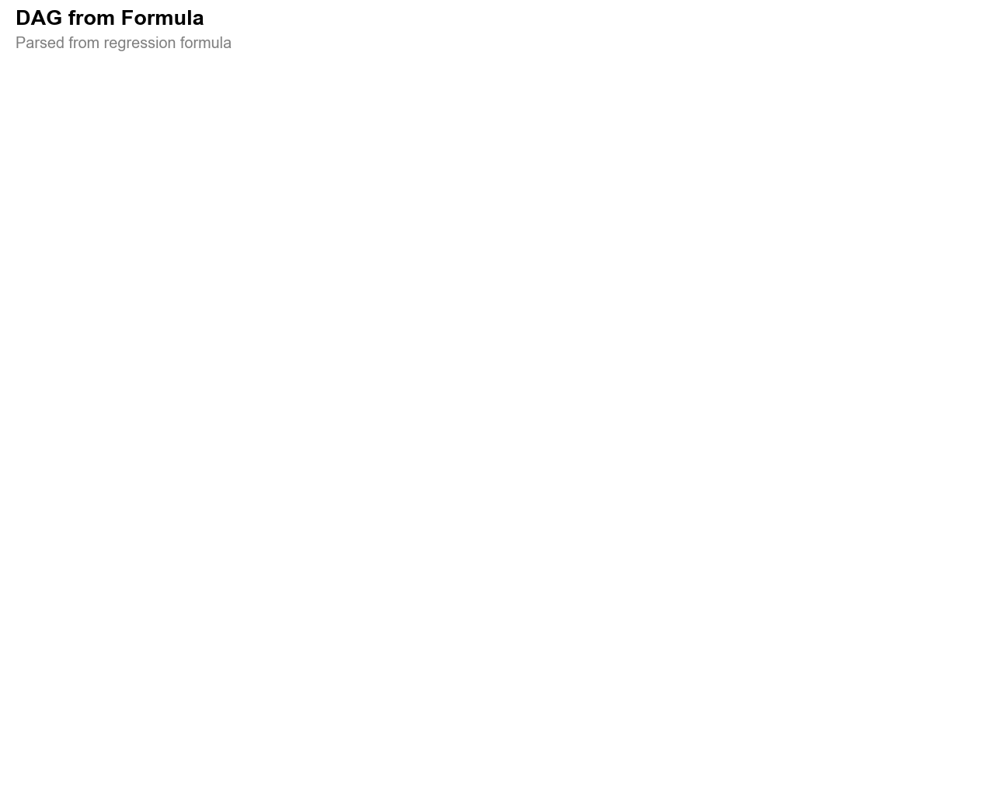

In [275]:
print("=" * 60)
print("TEST 54: DAG from Formula")
print("=" * 60)

fig = dag_from_formula(
    "Y ~ X + Z; X ~ Z",
    title='DAG from Formula',
    subtitle='Parsed from regression formula',
    style_mode='viridis'
)

plt.close()

In [276]:
print("=" * 60)
print("TEST 55: Interactive DAG")
print("=" * 60)

fig = dag_interactive(
    nodes=dag_nodes,
    edges=dag_edges,
    title='Interactive DAG',
    style_mode='viridis'
)

fig.show()

TEST 55: Interactive DAG


## 9.2 Sankey Diagrams

In [277]:
from sociopathit.visuals import flow as flow_module
importlib.reload(flow_module)
from sociopathit.visuals.flow import sankey_interactive

# Create Sankey flow data as lists
source_list = ['A', 'A', 'B', 'B', 'C']
target_list = ['X', 'Y', 'X', 'Y', 'Y']
value_list = [8, 4, 2, 8, 5]

print("=" * 60)
print("TEST 56: Interactive Sankey Diagram")
print("=" * 60)

fig = sankey_interactive(
    source=source_list,
    target=target_list,
    value=value_list,
    title='Flow Visualization',
    style_mode='viridis'
)

fig.show()

TEST 56: Interactive Sankey Diagram


## 9.3 Alluvial Diagrams

In [278]:
from sociopathit.visuals.flow import alluvial_interactive

# Create alluvial data - aggregated by stage combinations
df_alluvial = pd.DataFrame({
    'stage1': ['A', 'A', 'B', 'B', 'C'] * 4,
    'stage2': ['X', 'Y', 'X', 'Y', 'Y'] * 4,
    'stage3': ['M', 'M', 'N', 'N', 'M'] * 4,
})

print("=" * 60)
print("TEST 57: Interactive Alluvial Diagram")
print("=" * 60)

fig = alluvial_interactive(
    df_alluvial,
    stages=['stage1', 'stage2', 'stage3'],
    title='Multi-stage Flow',
    style_mode='viridis'
)

fig.show()

TEST 57: Interactive Alluvial Diagram


<a id='dimensional'></a>
# 10. Dimensional Analysis

Test factor maps, PCA plots, MCA visualizations, and scree plots.

## 10.1 Factor Maps

TEST 58: Factor Map (2D)
PCA explained variance: [9.99999275e-01 3.66961846e-07]


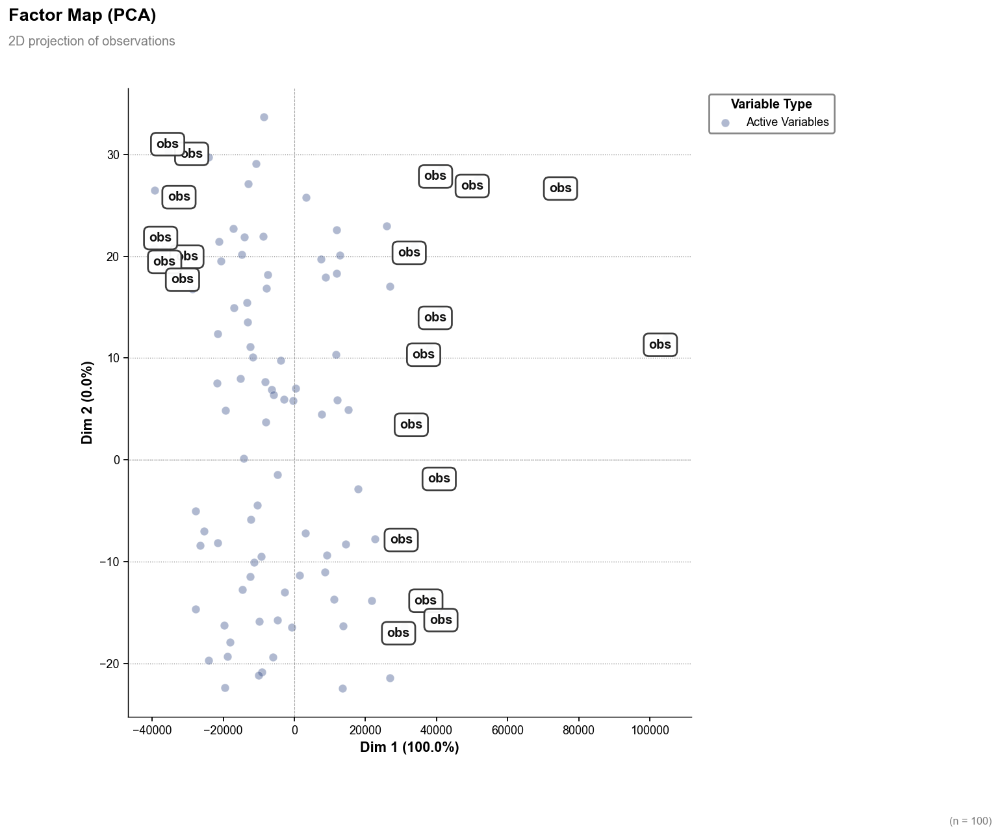

In [279]:
# Run PCA for factor map visualization
from sklearn.decomposition import PCA

# Prepare data for PCA
X_pca = df_continuous[['value', 'satisfaction', 'income', 'age']].copy()

# Fit PCA
pca = PCA(n_components=3)
coords_pca = pca.fit_transform(X_pca)

# Create coordinate DataFrame with proper format
active_coords = pd.DataFrame(coords_pca[:, :2], columns=[0, 1])

# For demonstration, add some row labels
active_coords.index = [f"Obs_{i}" for i in range(len(active_coords))]

from sociopathit.visuals import factormap as fm_module
importlib.reload(fm_module)
from sociopathit.visuals.factormap import (
    factormap, 
    factormap_interactive,
    factormap_3d,
    factormap_3d_interactive,
    variance_explained,
    variance_explained_interactive
)

print("=" * 60)
print("TEST 58: Factor Map (2D)")
print("=" * 60)
print(f"PCA explained variance: {pca.explained_variance_ratio_[:2]}")
print("=" * 60)

# Select a subset to label
label_subset = 20
fig, ax = factormap(
    active_coords.head(100),  # Use subset for clarity
    title='Factor Map (PCA)',
    subtitle='2D projection of observations',
    style_mode='viridis',
    label_filter=label_subset,
    perc_var=pca.explained_variance_ratio_[:2]
)

plt.close()

In [280]:
print("=" * 60)
print("TEST 59: Interactive 2D Factor Map")
print("=" * 60)

fig = factormap_interactive(
    active_coords.head(100),
    title='Interactive Factor Map',
    subtitle='2D PCA projection',
    style_mode='viridis',
    label_filter=20,
    perc_var=pca.explained_variance_ratio_[:2]
)

fig.show()

TEST 59: Interactive 2D Factor Map


TEST 60: 3D Factor Map


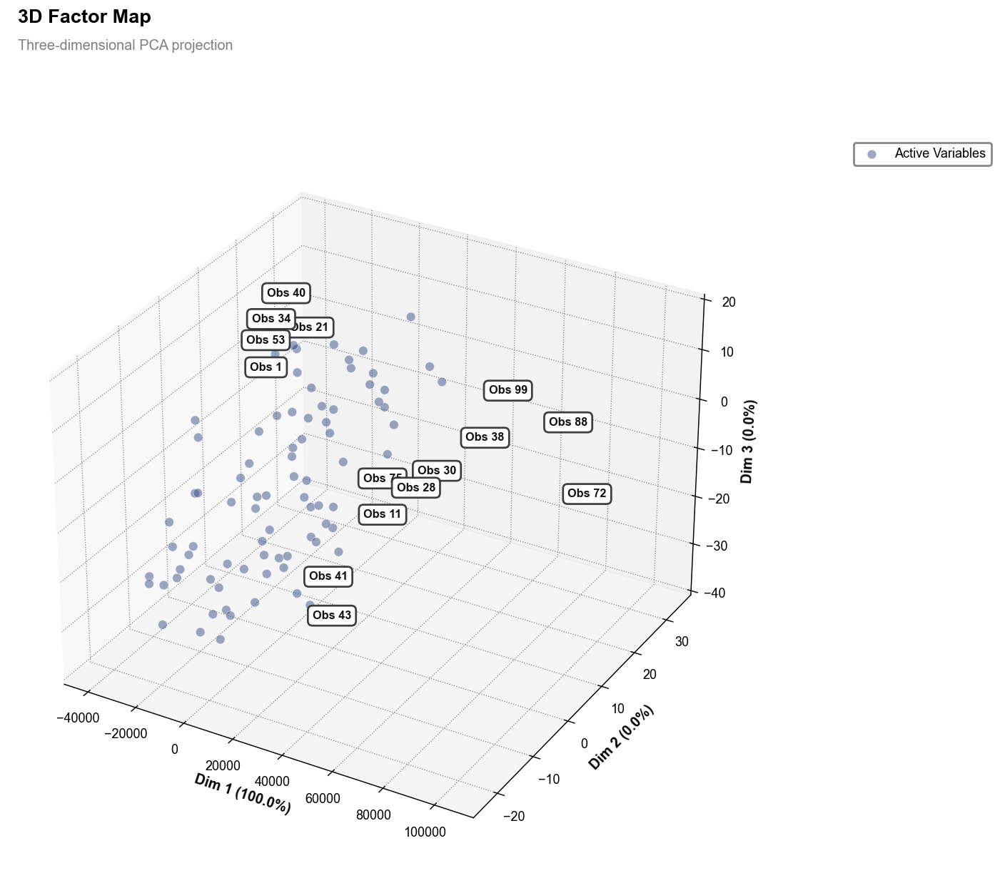

In [281]:
print("=" * 60)
print("TEST 60: 3D Factor Map")
print("=" * 60)

# Create 3D coordinates
coords_3d = pd.DataFrame(coords_pca, columns=[0, 1, 2])
coords_3d.index = [f"Obs_{i}" for i in range(len(coords_3d))]

fig, ax = factormap_3d(
    coords_3d.head(100),
    title='3D Factor Map',
    subtitle='Three-dimensional PCA projection',
    style_mode='viridis',
    label_filter=15,
    perc_var=pca.explained_variance_ratio_[:3]
)

plt.close()

In [282]:
print("=" * 60)
print("TEST 61: Interactive 3D Factor Map")
print("=" * 60)

fig = factormap_3d_interactive(
    coords_3d.head(100),
    title='Interactive 3D Factor Map',
    subtitle='Rotate and explore',
    style_mode='viridis',
    perc_var=pca.explained_variance_ratio_[:3]
)

fig.show()

TEST 61: Interactive 3D Factor Map


## 10.2 Variance Explained (Scree Plots)

TEST 62: Scree Plot


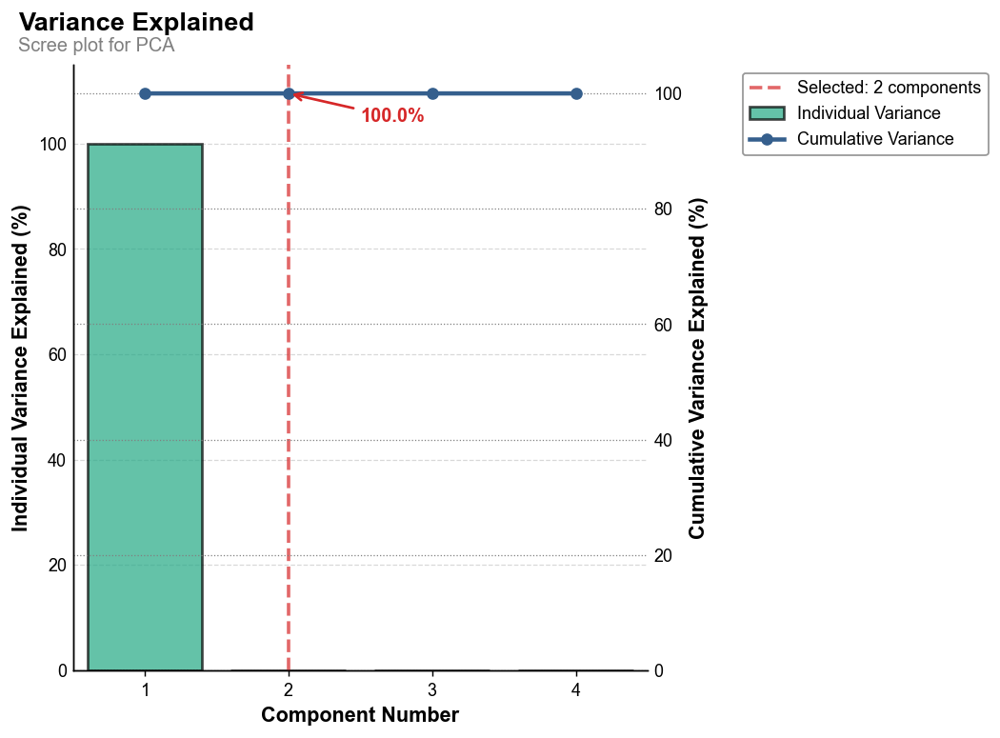

In [283]:
# Run PCA with more components for scree plot
pca_full = PCA()
pca_full.fit(X_pca)
variance_ratios = pca_full.explained_variance_ratio_

print("=" * 60)
print("TEST 62: Scree Plot")
print("=" * 60)

fig, ax = variance_explained(
    variance_ratios=variance_ratios,
    n_components=2,
    title='Variance Explained',
    subtitle='Scree plot for PCA',
    style_mode='viridis'
)

plt.close()

In [284]:
print("=" * 60)
print("TEST 63: Interactive Scree Plot")
print("=" * 60)

fig = variance_explained_interactive(
    variance_ratios=variance_ratios,
    n_components=2,
    title='Interactive Scree Plot',
    subtitle='Hover to see exact percentages',
    style_mode='viridis'
)

fig.show()

TEST 63: Interactive Scree Plot


<a id='specialized'></a>
# 11. Text & Specialized Visualizations

Test word clouds, feature importance plots, and waterfall charts.

## 11.1 Word Clouds

TEST 64: Word Cloud


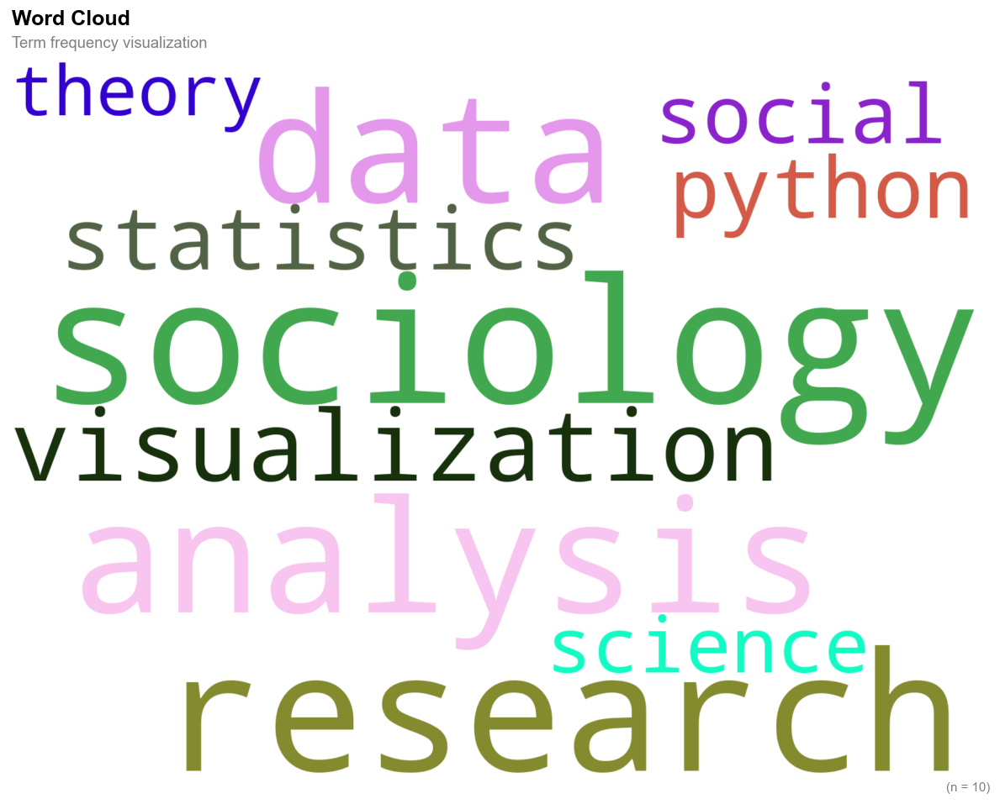

In [285]:
from sociopathit.visuals import wordcloud as wc_module
importlib.reload(wc_module)
from sociopathit.visuals.wordcloud import wordcloud, wordcloud_interactive

# Create word frequency dictionary
words = [
    'sociology', 'research', 'analysis', 'data', 'visualization',
    'statistics', 'python', 'social', 'science', 'theory'
]
frequencies = [50, 45, 40, 38, 35, 32, 30, 28, 25, 22]
freq_dict = dict(zip(words, frequencies))

print("=" * 60)
print("TEST 64: Word Cloud")
print("=" * 60)

fig, ax = wordcloud(
    freq_dict=freq_dict,
    title='Word Cloud',
    subtitle='Term frequency visualization',
    style_mode='viridis'
)

plt.close()

In [286]:
print("=" * 60)
print("TEST 65: Interactive Word Cloud")
print("=" * 60)

fig = wordcloud_interactive(
    freq_dict=freq_dict,
    title='Interactive Word Cloud',
    style_mode='viridis'
)

fig.show()

TEST 65: Interactive Word Cloud


## 11.2 Feature Importance

TEST 66: Feature Importance Bar Chart


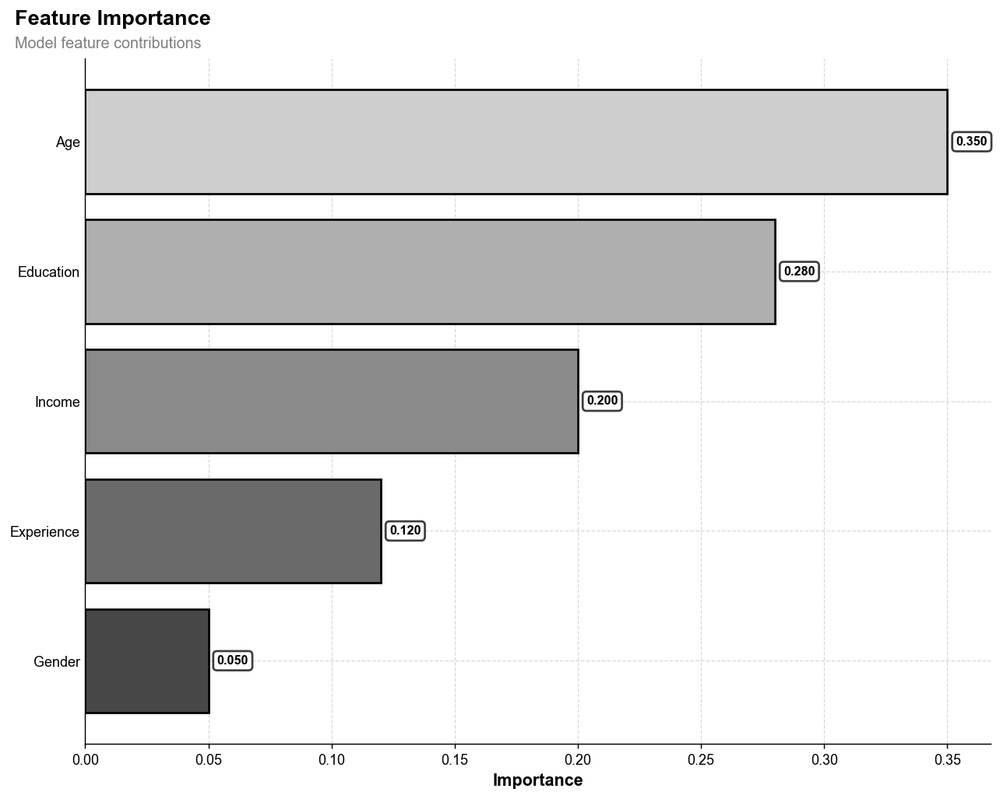

In [287]:
from sociopathit.visuals import feature as feature_module
importlib.reload(feature_module)
from sociopathit.visuals.feature import (
    feature_importance_bar,
    feature_importance_bar_interactive,
    feature_waterfall,
    feature_waterfall_interactive
)

# Feature importance as dictionary
feature_importance = {
    'Age': 0.35,
    'Education': 0.28,
    'Income': 0.20,
    'Experience': 0.12,
    'Gender': 0.05
}

print("=" * 60)
print("TEST 66: Feature Importance Bar Chart")
print("=" * 60)

fig = feature_importance_bar(
    importance=feature_importance,
    title='Feature Importance',
    subtitle='Model feature contributions',
    style_mode='reviewer3'
)

plt.close()


In [288]:
print("=" * 60)
print("TEST 67: Interactive Feature Importance")
print("=" * 60)

fig = feature_importance_bar_interactive(
    importance=feature_importance,
    title='Interactive Feature Importance',
    style_mode='viridis'
)

fig.show()

TEST 67: Interactive Feature Importance


## 11.3 Waterfall Charts

TEST 68: Waterfall Chart


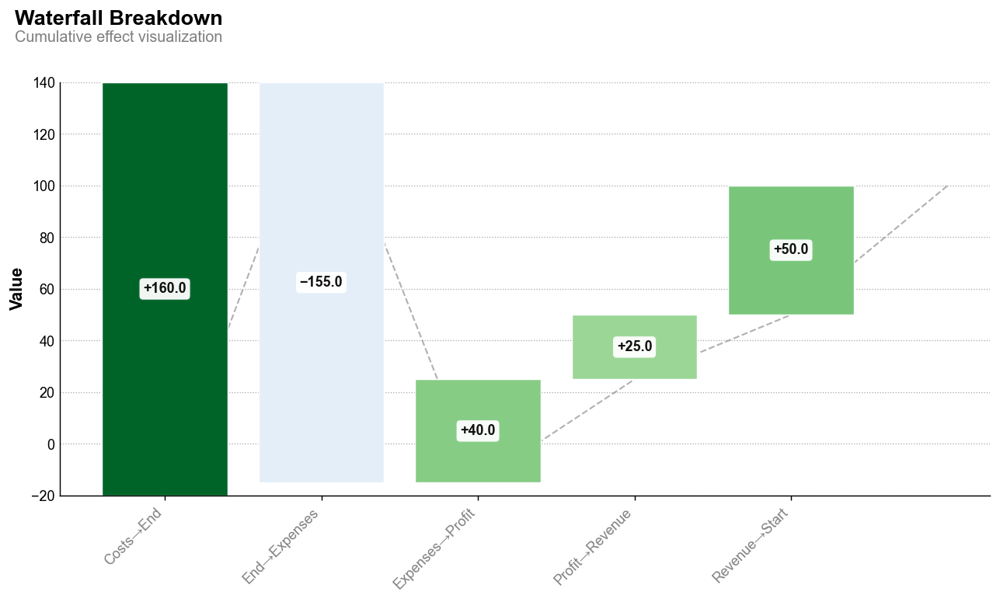

In [289]:
from sociopathit.visuals import waterfall as waterfall_module
importlib.reload(waterfall_module)
from sociopathit.visuals.waterfall import waterfall, waterfall_interactive

# Waterfall data
df_waterfall = pd.DataFrame({
    'category': ['Start', 'Revenue', 'Costs', 'Expenses', 'Profit', 'End'],
    'value': [100, 50, -20, -15, 25, 140],
    'type': ['total', 'increase', 'decrease', 'decrease', 'increase', 'total']
})

print("=" * 60)
print("TEST 68: Waterfall Chart")
print("=" * 60)

fig, ax = waterfall(
    df_waterfall,
    x='category',
    y='value',
    title='Waterfall Breakdown',
    subtitle='Cumulative effect visualization',
    style_mode='viridis'
)

plt.close()

In [290]:
print("=" * 60)
print("TEST 69: Interactive Waterfall Chart")
print("=" * 60)

fig = waterfall_interactive(
    df_waterfall,
    x='category',
    y='value',
    title='Interactive Waterfall',
)

fig.show()


TEST 69: Interactive Waterfall Chart


## 11.4 SHAP-style Feature Waterfall

TEST 70: Feature Waterfall (SHAP-style)


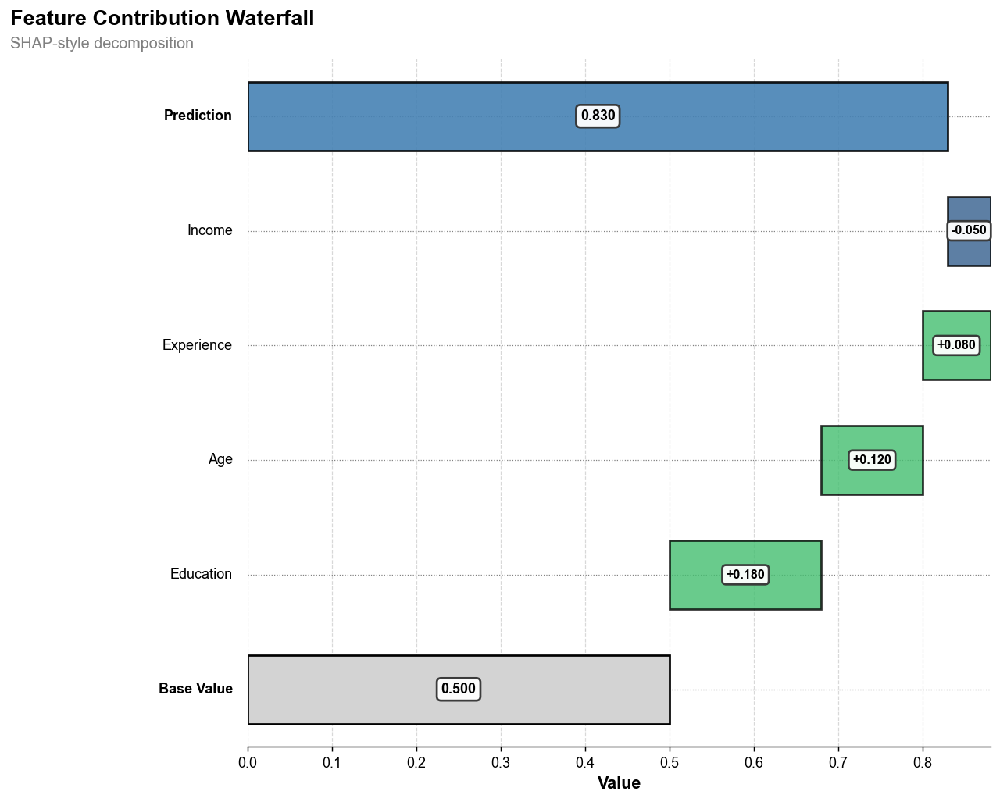

In [291]:
# SHAP waterfall as dictionary
shap_values = {
    'Age': 0.12,
    'Education': 0.18,
    'Income': -0.05,
    'Experience': 0.08
}

print("=" * 60)
print("TEST 70: Feature Waterfall (SHAP-style)")
print("=" * 60)

fig = feature_waterfall(
    importance=shap_values,
    base_value=0.5,
    prediction_value=0.83,
    title='Feature Contribution Waterfall',
    subtitle='SHAP-style decomposition',
    style_mode='viridis'
)

plt.close()


In [292]:
print("=" * 60)
print("TEST 71: Interactive Feature Waterfall")
print("=" * 60)

fig = feature_waterfall_interactive(
    importance=shap_values,
    base_value=0.5,
    prediction_value=0.83,
    title='Interactive Feature Waterfall',
)

fig.show()


TEST 71: Interactive Feature Waterfall
